# **Projet 6 : Classifiez automatiquement des biens de consommation - Faisabilité images**

**Table des matières**<a id='toc0_'></a>    
- 1. [Introduction](#toc1_)    
  - 1.1. [Contexte](#toc1_1_)    
  - 1.2. [Mission](#toc1_2_)    
  - 1.3. [Objectif du Notebook](#toc1_3_)    
- 2. [Installation des librairies](#toc2_)    
- 3. [Importation des données](#toc3_)    
- 4. [Analyse exploratoire des images](#toc4_)    
- 5. [Pré-traitement des images](#toc5_)    
- 6. [Classification non supervisée](#toc6_)    
  - 6.1. [SIFT](#toc6_1_)    
    - 6.1.1. [Extraction des features sur l'ensemble des images](#toc6_1_1_)    
    - 6.1.2. [Optimisation d'un Kmeans sur l'ensemble des features](#toc6_1_2_)    
    - 6.1.3. [Construction des vecteurs pour chaque image](#toc6_1_3_)    
    - 6.1.4. [Clustering](#toc6_1_4_)    
  - 6.2. [CNN - Convolution Neural Network](#toc6_2_)    
    - 6.2.1. [VGG16](#toc6_2_1_)    
    - 6.2.2. [ResNet](#toc6_2_2_)    
      - 6.2.2.1. [ResNet-152v1](#toc6_2_2_1_)    
      - 6.2.2.2. [ResNet-152v2](#toc6_2_2_2_)    
    - 6.2.3. [ IncetpionNet](#toc6_2_3_)    
      - 6.2.3.1. [InceptionNet_V3](#toc6_2_3_1_)    
      - 6.2.3.2. [InceptionNet_ResNet](#toc6_2_3_2_)    
- 7. [Résultats](#toc7_)    

<!-- vscode-jupyter-toc-config
	numbering=true
	anchor=true
	flat=false
	minLevel=2
	maxLevel=6
	/vscode-jupyter-toc-config -->
<!-- THIS CELL WILL BE REPLACED ON TOC UPDATE. DO NOT WRITE YOUR TEXT IN THIS CELL -->

## 1. <a id='toc1_'></a>[Introduction](#toc0_)
### 1.1. <a id='toc1_1_'></a>[Contexte](#toc0_)

Sur la place de marché, des vendeurs proposent des articles à des acheteurs en postant une photo et une description.

Pour l'instant, l'attribution de la catégorie d'un article est effectuée manuellement par les vendeurs, et est donc peu fiable. De plus, le volume des articles est pour l’instant très petit.

Pour rendre l’expérience utilisateur des vendeurs (faciliter la mise en ligne de nouveaux articles) et des acheteurs (faciliter la recherche de produits) la plus fluide possible, et dans l'optique d'un passage à l'échelle, il devient nécessaire d'automatiser cette tâche.

Linda, Lead Data Scientist, vous demande donc d'étudier la faisabilité d'un moteur de classification des articles en différentes catégories, avec un niveau de précision suffisant.

Voici certaintes parties du mail envoyé par Linda.

### 1.2. <a id='toc1_2_'></a>[Mission](#toc0_)

1. Ta mission est de réaliser, dans une première itération, une étude de faisabilité d'un moteur de classification d'articles, basé sur une image et une description, pour l'automatisation de l'attribution de la catégorie de l'article.

2. Pourrais-tu réaliser une classification supervisée à partir des images ? Je souhaiterais que tu mettes en place une data augmentation afin d’optimiser le modèle.

3. Pourrais-tu tester la collecte de produits à base de “champagne” via l’API Rapid API ? Je souhaiterais que tu puisses nous fournir une extraction des 10 premiers produits dans un fichier “.csv”, contenant pour chaque produit les données suivantes : foodId, label, category, foodContentsLabel, image.

### 1.3. <a id='toc1_3_'></a>[Objectif du Notebook](#toc0_)

Dans ce Notebook nous verrons : 
- l'analyse exploratoire du Dataset pour la partie image
- le pré-traitement des images 
- L'étude de faisabilité de la classification non supervisée des objets en se basant uniquement sur les images :  
    - Mise en place d'un algorithme classique (SIFT)
    - Mise en place d'un transfert learning sur des réseaux de neuronnes de types CNN 

## 2. <a id='toc2_'></a>[Installation des librairies](#toc0_)

In [1]:
import numpy as np 
import pandas as pd 

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.cluster import KMeans

from PIL import Image, ImageOps, ImageFilter
import cv2
from skimage import io, color, exposure, transform, restoration

from fonctions import fct_data, fct_image, fct_clustering

## 3. <a id='toc3_'></a>[Importation des données](#toc0_)

In [3]:
# Importation de data : 

data = fct_data.chargement_pickle(
    name='data_pretraite_NLP',
    chemin='2. Sauvegardes/1. NLP'
)

data.head()

,product_name,description,image,category_cleaned,desc_cleaned_lem,desc_cleaned_stem,desc_tokenize_without_sw,desc_tokenize
0,Elegance Polyester Multicolor Abstract Eyelet ...,Key Features of Elegance Polyester Multicolor ...,55b85ea15a1536d46b7190ad6fff8ce7.jpg,Home Furnishing,key elegance polyester multicolor abstract eye...,key eleg polyest multicolor abstract eyelet do...,"[key, elegance, polyester, multicolor, abstrac...","[key, features, of, elegance, polyester, multi..."
1,Sathiyas Cotton Bath Towel,Specifications of Sathiyas Cotton Bath Towel (...,7b72c92c2f6c40268628ec5f14c6d590.jpg,Baby Care,sathiyas cotton bath towel bath towel red yell...,sathiya cotton bath towel bath towel red yello...,"[sathiyas, cotton, bath, towel, 3, bath, towel...","[specifications, of, sathiyas, cotton, bath, t..."
2,Eurospa Cotton Terry Face Towel Set,Key Features of Eurospa Cotton Terry Face Towe...,64d5d4a258243731dc7bbb1eef49ad74.jpg,Baby Care,key eurospa cotton terry face towel set size s...,key eurospa cotton terri face towel set size s...,"[key, eurospa, cotton, terry, face, towel, set...","[key, features, of, eurospa, cotton, terry, fa..."
3,SANTOSH ROYAL FASHION Cotton Printed King size...,Key Features of SANTOSH ROYAL FASHION Cotton P...,d4684dcdc759dd9cdf41504698d737d8.jpg,Home Furnishing,key santosh royal fashion cotton printed king ...,key santosh royal fashion cotton print king si...,"[key, santosh, royal, fashion, cotton, printed...","[key, features, of, santosh, royal, fashion, c..."
4,Jaipur Print Cotton Floral King sized Double B...,Key Features of Jaipur Print Cotton Floral Kin...,6325b6870c54cd47be6ebfbffa620ec7.jpg,Home Furnishing,key jaipur print cotton floral king sized doub...,key jaipur print cotton floral king size doubl...,"[key, jaipur, print, cotton, floral, king, siz...","[key, features, of, jaipur, print, cotton, flo..."


In [4]:
# Préparation de data : 
data = data[['product_name', 'description', 'image', 'category_cleaned']]

# Création du chemin des images : 
path = '1. Données/Images'
data['chemin_image'] = path + '/' + data['image']

display(data.head())

del path

,product_name,description,image,category_cleaned,chemin_image
0,Elegance Polyester Multicolor Abstract Eyelet ...,Key Features of Elegance Polyester Multicolor ...,55b85ea15a1536d46b7190ad6fff8ce7.jpg,Home Furnishing,1. Données/Images/55b85ea15a1536d46b7190ad6fff...
1,Sathiyas Cotton Bath Towel,Specifications of Sathiyas Cotton Bath Towel (...,7b72c92c2f6c40268628ec5f14c6d590.jpg,Baby Care,1. Données/Images/7b72c92c2f6c40268628ec5f14c6...
2,Eurospa Cotton Terry Face Towel Set,Key Features of Eurospa Cotton Terry Face Towe...,64d5d4a258243731dc7bbb1eef49ad74.jpg,Baby Care,1. Données/Images/64d5d4a258243731dc7bbb1eef49...
3,SANTOSH ROYAL FASHION Cotton Printed King size...,Key Features of SANTOSH ROYAL FASHION Cotton P...,d4684dcdc759dd9cdf41504698d737d8.jpg,Home Furnishing,1. Données/Images/d4684dcdc759dd9cdf41504698d7...
4,Jaipur Print Cotton Floral King sized Double B...,Key Features of Jaipur Print Cotton Floral Kin...,6325b6870c54cd47be6ebfbffa620ec7.jpg,Home Furnishing,1. Données/Images/6325b6870c54cd47be6ebfbffa62...


## 4. <a id='toc4_'></a>[Analyse exploratoire des images](#toc0_)

,image
category_cleaned,
Baby Care,150
Beauty and Personal Care,150
Computers,150
Home Decor & Festive Needs,150
Home Furnishing,150
Kitchen & Dining,150
Watches,150


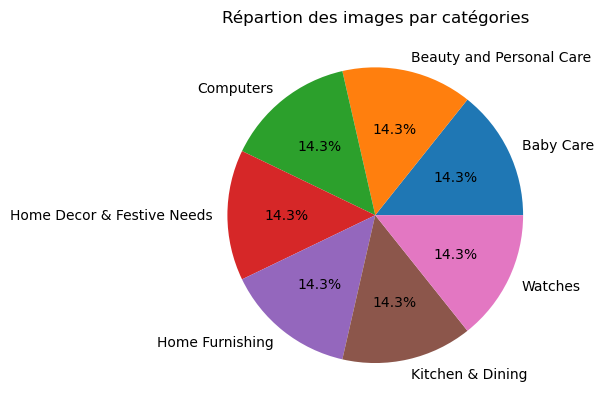

In [5]:
# Visualisation du nombre d'images par catégorie : 

df = data.groupby('category_cleaned').agg({'image': 'count'})
display(df)

plt.figure()
plt.pie(
    x=df['image'],
    labels=df.index,
    autopct='%1.1f%%'
    )
plt.title('Répartion des images par catégories')
plt.show()

del df

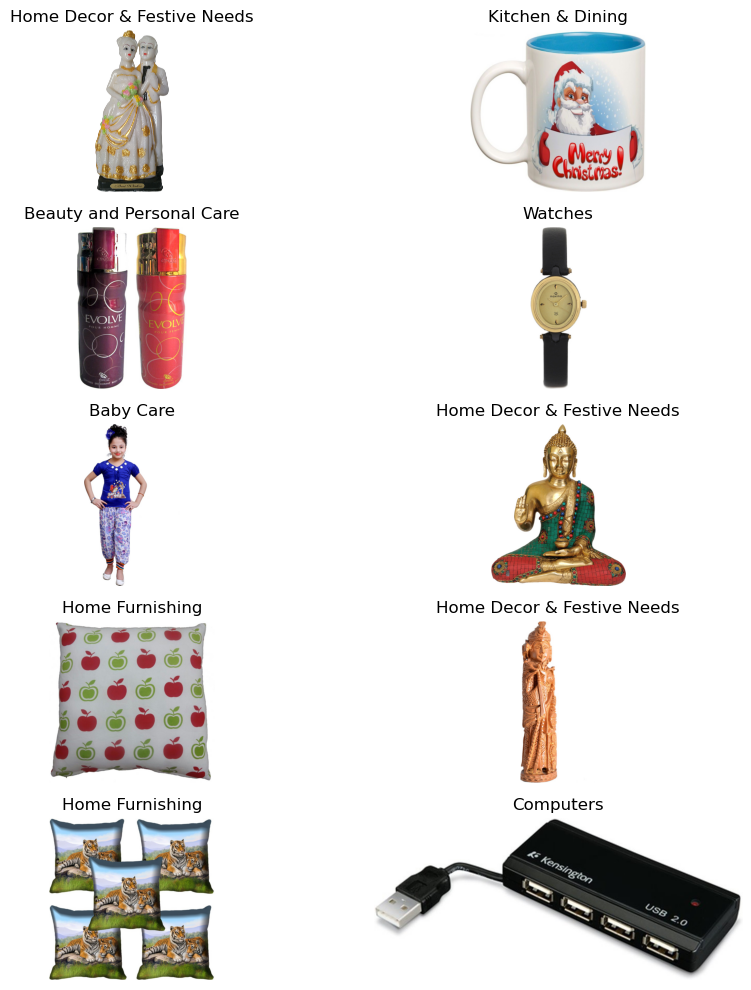

In [6]:
# Visualisation de 10 images au hasard : 

df = data.sample(10).reset_index(drop=True)

plt.figure(figsize=(10,10))
for i in range(10):
    plt.subplot(5,2,i+1)
    img = np.array(Image.open(df.loc[i, 'chemin_image']))
    plt.imshow(img)
    plt.title(df.loc[i, 'category_cleaned'])
    plt.axis('off')
plt.tight_layout()
plt.show()


del df, i, img

/Users/maxime/anaconda3/envs/Projet6/lib/python3.11/site-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (93680328 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


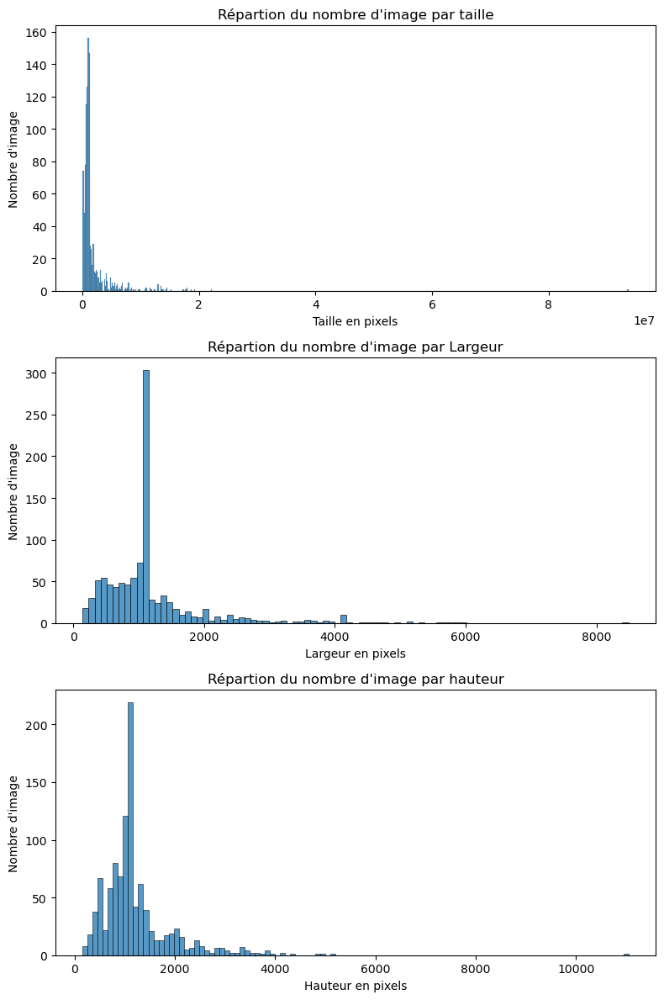

In [7]:
# Répartition des tailles, largeurs et hauteurs des images : 

data['taille_image'], data['largeur_image'], data['hauteur_image'] = \
    fct_image.dimensions_image(data['chemin_image'])

plt.figure(figsize=(8,12))

plt.subplot(3, 1, 1)
sns.histplot(
    data=data['taille_image'],
    )
plt.xlabel('Taille en pixels')
plt.ylabel("Nombre d'image")
plt.title("Répartion du nombre d'image par taille")

plt.subplot(3, 1, 2)
sns.histplot(
    data=data['largeur_image'],
    )
plt.xlabel('Largeur en pixels')
plt.ylabel("Nombre d'image")
plt.title("Répartion du nombre d'image par Largeur")

plt.subplot(3, 1, 3)
sns.histplot(
    data=data['hauteur_image'],
    )
plt.xlabel('Hauteur en pixels')
plt.ylabel("Nombre d'image")
plt.title("Répartion du nombre d'image par hauteur")

plt.tight_layout()
plt.show()

Les tailles, hauteur et largeurs de chaque image sont mal répartis.  
    
    --> Uniformisation obligatoire. 

In [8]:
# Vérification du format des images : 

format = pd.Series([Image.open(img).mode for img in data['chemin_image']])
display(format.value_counts())

del format

/Users/maxime/anaconda3/envs/Projet6/lib/python3.11/site-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (93680328 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


RGB    1050
Name: count, dtype: int64

Toutes les images sont au format RGB (3 dimensions par pixel -> allant de 0 à 255)

## 5. <a id='toc5_'></a>[Pré-traitement des images](#toc0_)

Le traitement des images sera effectué comme suit : 
- Réduction des taille (224x224) --> taille nécessaire pour l'utilisation des réseaux de neuronnes
- Conversion de l'image en niveau de gris --> nécessaire pour l'utilisation de SIFT 
- Suppression du bruit 
- Egalisation de l'histogramme

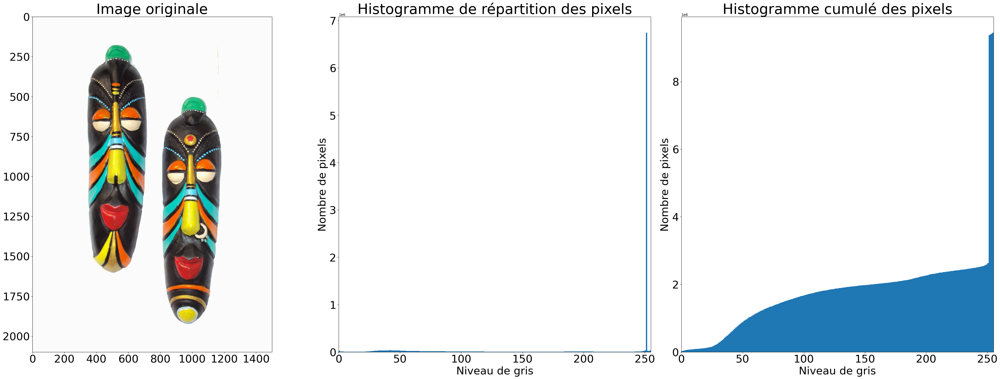

In [9]:
# Chargement d'une image : 

path = data.loc[987, 'chemin_image']
image = Image.open(path)

fct_image.histogram_pixels(
    img=image,
    titre='Image originale',
    )

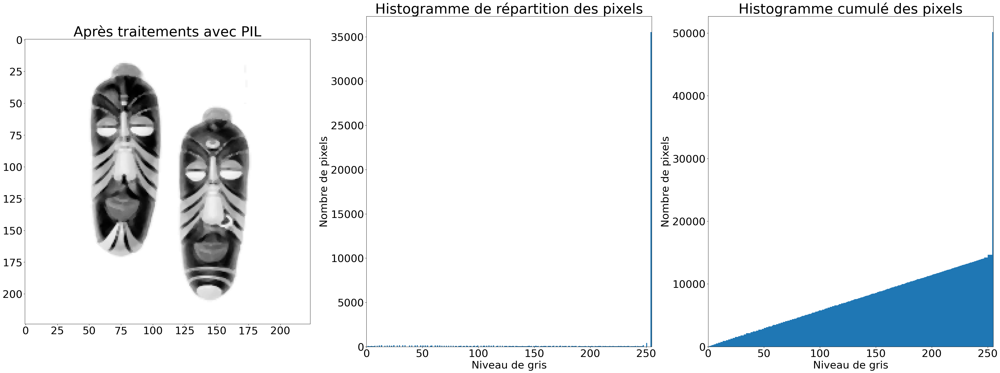

In [10]:
# Traitement à l'aide de PIL : 

# 1. Réduction de la taille à 224x224 : 
image = image.resize((224,224), Image.LANCZOS)

# 2. Conversion en niveaux de gris : 
image = image.convert('L')

# 3. Suppression du bruit (filtre median) : 
image = image.filter(ImageFilter.MedianFilter(size=3))

# 4. Égalisation de l'histogramme avec PIL : 
image = ImageOps.equalize(image)

# 5. Affichage du résultat : 
fct_image.histogram_pixels(
    img=image,
    titre='Après traitements avec PIL',
    )

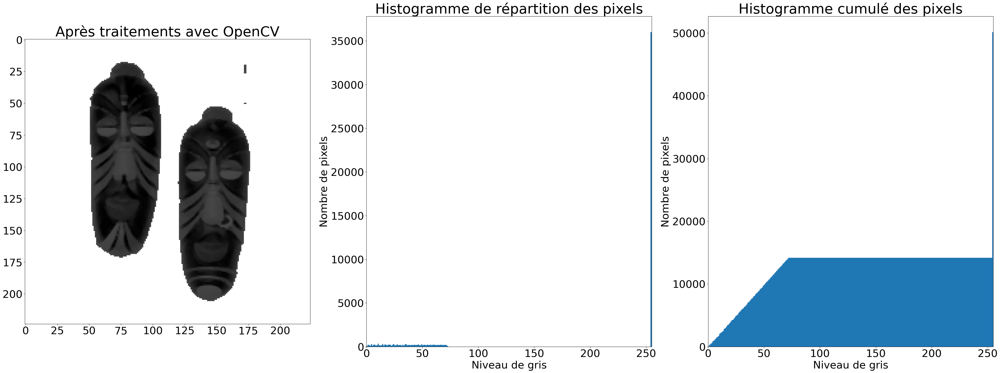

In [11]:
# Traitement à l'aide de OpenCV : 

# 0. Chargement de l'image :
image = cv2.imread(path)

# 1. Réduction de la taille à 224x224 : 
image = cv2.resize(image, (224,224), interpolation=cv2.INTER_AREA)

# 2. Conversion en niveaux de gris : 
image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# 3. Suppression du bruit (filtre median) : 
image = cv2.medianBlur(image, 3)

# 4. Égalisation de l'histogramme avec cv2 : 
image = cv2.equalizeHist(image)

# 5. Affichage du résultat : 
fct_image.histogram_pixels(
    img=image,
    titre='Après traitements avec OpenCV',
    )

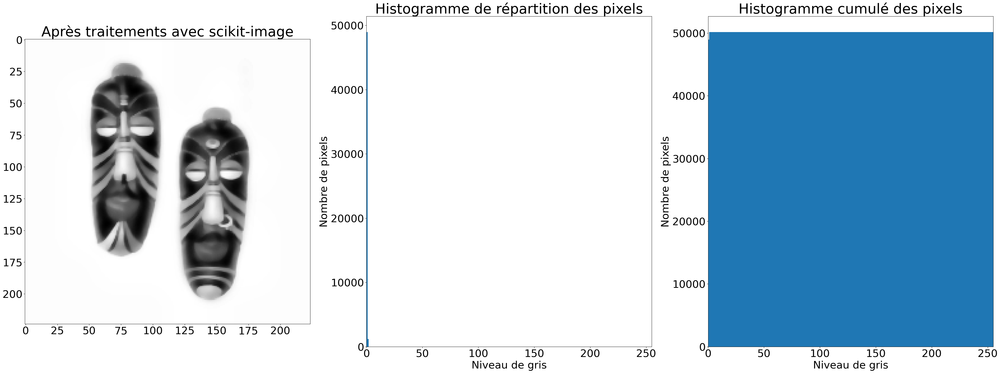

In [12]:
# # Traitement à l'aide de scikit-image : 

# 0. Chargement de l'image : 
image = io.imread(path)

# 1. Réduction de la taille à 224x224 : 
image = transform.resize(image, (224,224), anti_aliasing=True)

# 2. Conversion en niveaux de gris : 
image = color.rgb2gray(image)

# 3. Suppression du bruit (filtre de médiane) : 
image = restoration.denoise_tv_chambolle(image, weight=0.1)

# 4. Égalisation de l'histogramme : 
image = exposure.equalize_adapthist(image)

# 5. Affichage du résultat : 
fct_image.histogram_pixels(
    img=image,
    titre='Après traitements avec scikit-image',
    )

del image, path

Après utilisation de différentes bibliothèques pour le pré-traitement des images : 

    --> Choix de la bibliothèque PIL (histogramme cumulé mieux répartis)

In [13]:
# Création de l'ensemble des images pré-traitée : 

data['chemin_image_pretraitee'] = data['chemin_image'].apply(fct_image.process_image)
data.head()

/Users/maxime/anaconda3/envs/Projet6/lib/python3.11/site-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (93680328 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


,product_name,description,image,category_cleaned,chemin_image,taille_image,largeur_image,hauteur_image,chemin_image_pretraitee
0,Elegance Polyester Multicolor Abstract Eyelet ...,Key Features of Elegance Polyester Multicolor ...,55b85ea15a1536d46b7190ad6fff8ce7.jpg,Home Furnishing,1. Données/Images/55b85ea15a1536d46b7190ad6fff...,12960000,3600,3600,2. Sauvegardes/2. IMAGE/Images traitées/55b85e...
1,Sathiyas Cotton Bath Towel,Specifications of Sathiyas Cotton Bath Towel (...,7b72c92c2f6c40268628ec5f14c6d590.jpg,Baby Care,1. Données/Images/7b72c92c2f6c40268628ec5f14c6...,3087684,2388,1293,2. Sauvegardes/2. IMAGE/Images traitées/7b72c9...
2,Eurospa Cotton Terry Face Towel Set,Key Features of Eurospa Cotton Terry Face Towe...,64d5d4a258243731dc7bbb1eef49ad74.jpg,Baby Care,1. Données/Images/64d5d4a258243731dc7bbb1eef49...,715878,982,729,2. Sauvegardes/2. IMAGE/Images traitées/64d5d4...
3,SANTOSH ROYAL FASHION Cotton Printed King size...,Key Features of SANTOSH ROYAL FASHION Cotton P...,d4684dcdc759dd9cdf41504698d737d8.jpg,Home Furnishing,1. Données/Images/d4684dcdc759dd9cdf41504698d7...,914100,1100,831,2. Sauvegardes/2. IMAGE/Images traitées/d4684d...
4,Jaipur Print Cotton Floral King sized Double B...,Key Features of Jaipur Print Cotton Floral Kin...,6325b6870c54cd47be6ebfbffa620ec7.jpg,Home Furnishing,1. Données/Images/6325b6870c54cd47be6ebfbffa62...,5574960,2670,2088,2. Sauvegardes/2. IMAGE/Images traitées/6325b6...


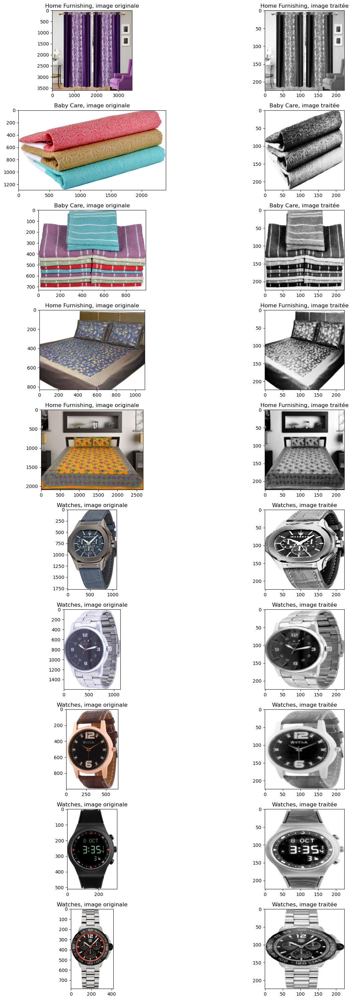

In [14]:
# Vérification de la cohérence : 
df = data[['category_cleaned', 'chemin_image','chemin_image_pretraitee']].sample(10).copy()
df = df.reset_index(drop=True)

plt.figure(figsize=(15, 30))

for i in range(10): 
    
    image = Image.open(data.loc[i, 'chemin_image'])
    image_traitee = Image.open(data.loc[i, 'chemin_image_pretraitee'])
    categ = data.loc[i, 'category_cleaned']
    
    plt.subplot(10, 2, 2 * i + 1)
    plt.imshow(image, cmap='gray')
    plt.title(f"{categ}, image originale")
    
    plt.subplot(10, 2, 2 * i + 2)
    plt.imshow(image_traitee, cmap='gray')
    plt.title(f"{categ}, image traitée")
plt.tight_layout()
plt.show()

del df, i, image, image_traitee, categ

In [15]:
# Création d'un dictionnaire avec l'ensemble des tableaux Numpy des images prétraitées :

dict_images = {}

for image, chemin in zip(data['image'], data['chemin_image_pretraitee']):
    dict_images[image] = np.array(cv2.imread(chemin))
    
print(f"Nombre de photos stockées dans le dictionnaire : {len((dict_images))}")

del image, chemin

Nombre de photos stockées dans le dictionnaire : 1050


In [16]:
# Enregistrements : 

fct_data.enregistrement_pickle(
    name='data_pretraite_image',
    chemin='2. Sauvegardes/2. IMAGE',
    fichier=data,
)

fct_data.enregistrement_pickle(
    name='dict_images_pretraitees',
    chemin='2. Sauvegardes/2. IMAGE',
    fichier=dict_images,
)

## 6. <a id='toc6_'></a>[Classification non supervisée](#toc0_)

Pour chaque modèle d'extraction de features à partir des images pré-traitées: 
- Extraction de features. 
- Réduction en 2 dimensions à l'aide de TSNE (pour visualisation de la répartition des produits par catégories).
- Recherche en fonction de différentes perplexités de TSNE, les meilleurs hyperparamètres de KMeans fournissant le meileur clustering en comparaison des vraies catégories. (optimisation basée sur l'ARI)
- Calcul pour le meilleur KMeans et la meilleure perplecité, l'ARI, l'homogénéité, la complétude et la v-measure des clusters. (pour comparaison finale de la meilleures méthode d'extraction de features). 
- Visualisation des projections en 2 dimensions du clustering versus les catégories réelles. 

--> ARI (Adjusted Rand Index) : mesure de la similitude des clusters vis à vis des catégories réelles.  
--> Homogénéité : mesure à quel point chaque cluster contient principalement des produits d'une seule catégorie réelle.  
--> Complétude :  mesure à quel point tous les produits d'une même catégorie réelle sont regroupés dans le même cluster.  
--> V-measure : mesure combinée de l'homogénéité et de la complétude.

In [17]:
# Création d'un dictionnaire pour le stockage de l'ensemble des résultats : 
dict_img_class_non_supervisee = {}

### 6.1. <a id='toc6_1_'></a>[SIFT](#toc0_)
SIFT (Scale Invariant Feature Transform) est une méthode informatique développée pour analyser des images.  
C'est une technique qui permet de repérer des points importants dans une image et de les décrire de manière à ce qu'ils puissent être reconnus même si l'image est tournée ou change d'échelle.
#### 6.1.1. <a id='toc6_1_1_'></a>[Extraction des features sur l'ensemble des images](#toc0_)

In [19]:
# Extraction des features pour l'ensemble des images : 
all_features, bags_of_visual_words = \
    fct_image.extraction_features_sift(dico=dict_images)

print(f"Nombre de features sur l'ensemble des image du dataset : {len(all_features)}")
print(f"Nombre de bag of visual words total : {len(bags_of_visual_words)}")


Nombre de features sur l'ensemble des image du dataset : 426129
Nombre de bag of visual words total : 1050


#### 6.1.2. <a id='toc6_1_2_'></a>[Optimisation d'un Kmeans sur l'ensemble des features](#toc0_)

Testing K values: 100%|██████████| 6/6 [2:33:55<00:00, 1539.24s/it]


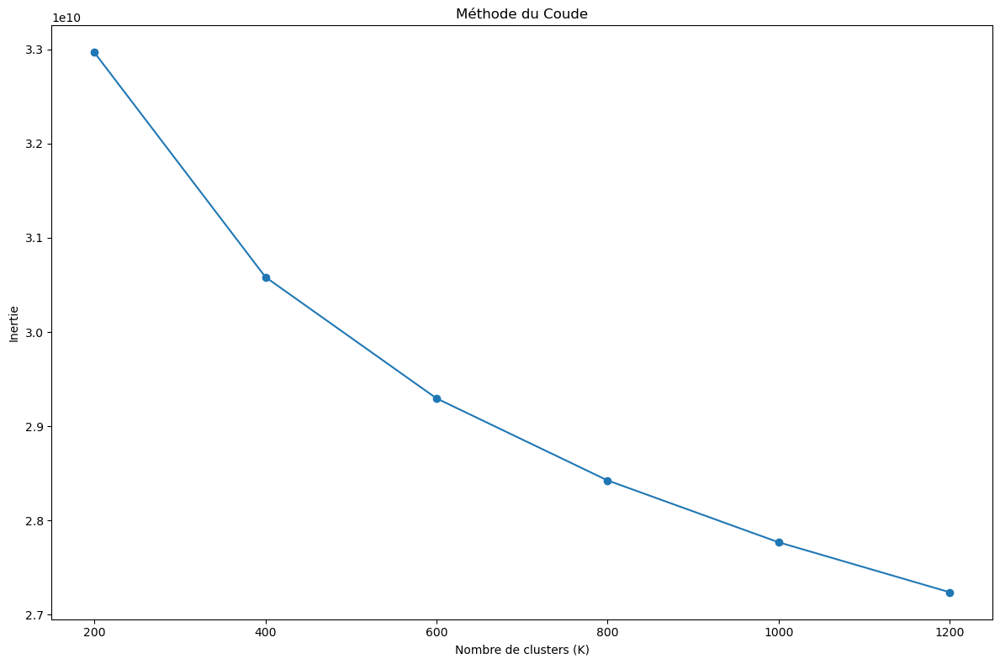

In [20]:
# Recherche du nombre de clusters pour l'utilisation de KMeans sur all_features : 

# Création de la liste des inerties de KMeans en fonction du nombre de clusters: 
k_range = [200, 400, 600, 800, 1000, 1200]

ls_inertie = fct_clustering.calcul_inertia(
    features=all_features,
    k_range=k_range,
    )

# Création d'un DataFrame avec les résultats : 
df = pd.DataFrame({
    'K': k_range,
    'Inertie': ls_inertie,
})

# Tracé du graphique de la méthode du coude : 
fct_clustering.graph_elbow_method(
    k_range=df['K'],
    inertia=df['Inertie']
)

del k_range, ls_inertie

Le coude se situe ici à environ 400 clusters d'après le graphique. 

In [22]:
# Création et entrainnement d'un modèle KMeans (700 clusters) sur all_features. 

# Instanciation du modèle KMeans pour SIFT : 
kmeans_SIFT = KMeans(
    n_clusters=400,
    random_state=42,
    n_init=10,
    )

# Entrainement de KMeans sur l'ensemble des features : 
kmeans_SIFT.fit(all_features)

# Enregistrement du modèle KMeans entrainé : 
fct_data.enregistrement_pickle(
    name='model_KMeans_SIFT',
    chemin='2. Sauvegardes/2. IMAGE',
    fichier=kmeans_SIFT
)

#### 6.1.3. <a id='toc6_1_3_'></a>[Construction des vecteurs pour chaque image](#toc0_)

In [24]:
# Création d'un dictionnaire contenant un vecteur par image
img_vect = fct_image.creation_vecteur_img_SIFT(
    descriptors_dict=bags_of_visual_words,
    model_kmeans=kmeans_SIFT,
)

# Création d'un DataFrame : 

df = pd.DataFrame(img_vect).T
df.columns = [f"center_{i}" for i in range(kmeans_SIFT.n_clusters)]
df = df.reset_index(drop=True)

X = df.values
print(f"Dimension du DataFrame de vectorisation : {df.shape}")

del all_features, bags_of_visual_words, kmeans_SIFT, img_vect

Dimension du DataFrame de vectorisation : (1050, 400)


#### 6.1.4. <a id='toc6_1_4_'></a>[Clustering](#toc0_)

----------------------------------------------------------------------------------------------------
Projections en 2D avec réduction TSNE en fonction de la perplexité


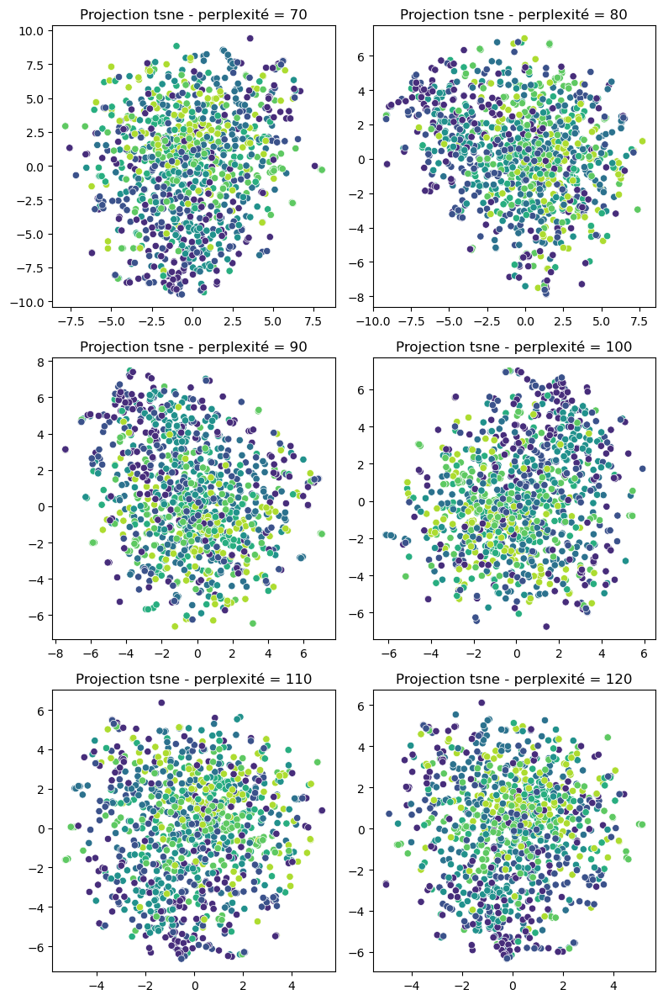

----------------------------------------------------------------------------------------------------
Meilleure perplexité de TSNE : 80
----------------------------------------------------------------------------------------------------
Meilleurs paramètres de KMeans : {'n_clusters': 7, 'random_state': 42, 'n_init': 10, 'max_iter': 100}


,coef_silh,dispersion,davies_bouldin
0,0.356854,3759.731445,0.838143


----------------------------------------------------------------------------------------------------
Score ARI du clustering : 0.0555
Homogénéité : 0.09137435348895172
Complétude : 0.09261880522016677
V-measure : 0.09199237088256444
----------------------------------------------------------------------------------------------------
Comparaison des projections du clustering vs catégories réelles
->
SIFT_image_pretraitee
----------------------------------------------------------------------------------------------------


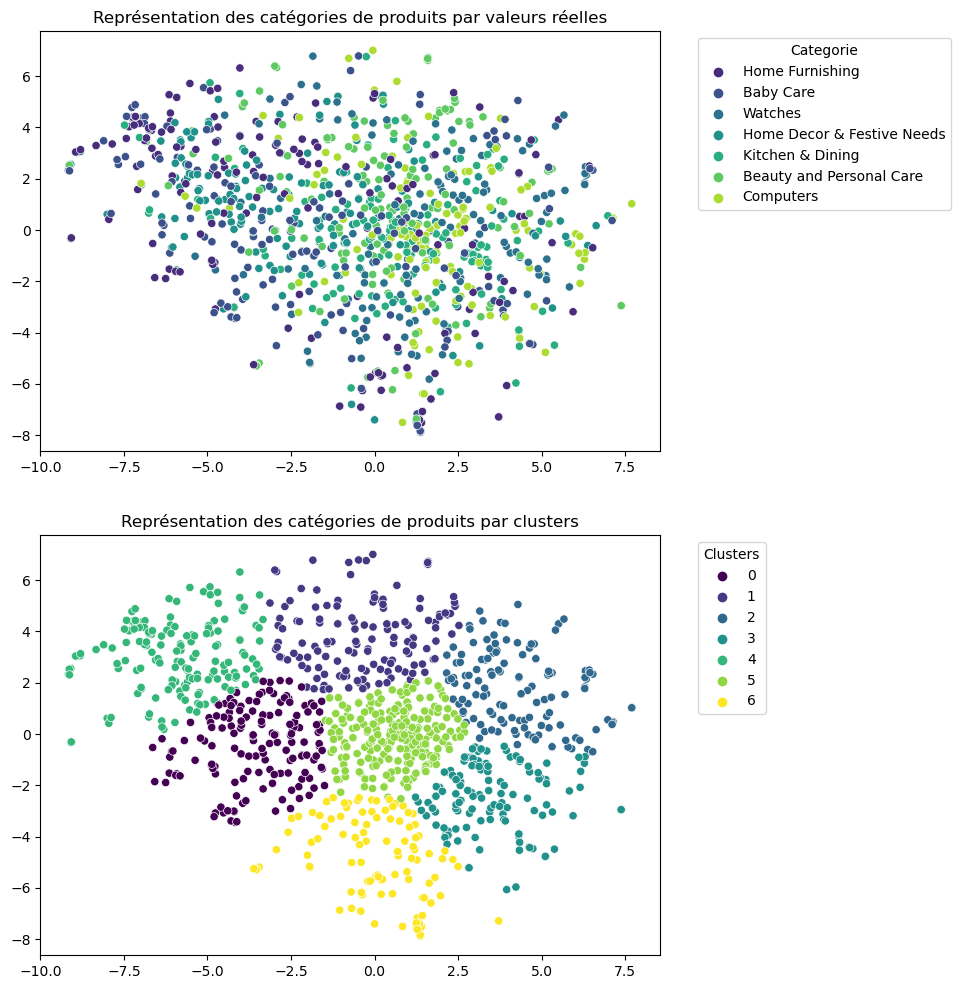

In [25]:
kmeans_params, tsne_perplexity, labels, dict_result = \
    fct_clustering.best_clustering(
        features=X, 
        y_true=data['category_cleaned'],
        tsne_perplexity_range=[70, 80, 90, 100, 110, 120],
        kmeans_clusters=data['category_cleaned'].nunique(),
        ls_ninit=[10, 20, 30, 50, 70, 80, 100],
        ls_maxiter=[100, 200, 300, 400, 500],
        title='SIFT_image_pretraitee', 
        )

In [26]:
# Enregistrement des résultats : 

# 1. Complétion de df : 
df['Category_true'] = data['category_cleaned']
df['Category_predict'] = labels

 # 2. Stockage des données : 
dict_img_class_non_supervisee['SIFT_image_pretraitee'] = {
    'df_vectorisation': df,
    'kmeans_best_params': kmeans_params,
    'TSNE_perplexity' : tsne_perplexity,
    'clustering_result' : dict_result
}

# 3. Enregistrement du dictionnaire au format pickle : 
fct_data.enregistrement_pickle(
    name='dict_img_class_non_supervisee',
    chemin='2. Sauvegardes/2. IMAGE',
    fichier=dict_img_class_non_supervisee,
    )

del X, df, labels, kmeans_params, tsne_perplexity, dict_result

### 6.2. <a id='toc6_2_'></a>[CNN - Convolution Neural Network](#toc0_)

Les réseaux de neurones convolutifs fonctionnent de manière similaire à une méthode traditionnelle d'apprentissage supervisé : 
1. Entrée : réception d'images
2. Extraction de features pour chaque image
3. Entrainement d'un classifieur

Pour l'étude, nous n'utilserons 3 types de modèle pré-entrainé afin d'uniquement extraire les features de chaque image : 

|Modèle|Description|
|-|-|
|**VGG16 (VGGNet)**|Connu pour sa simplicité et son efficacité : les couches convolutives profondes de VGG16 le rendent adapté au transfert d'apprentissage.|
|**ResNet (Residual Network)**|Introduction de connexions résiduelles qui permettent d'entraîner avec succès des réseaux CNN beaucoup plus profonds|
|**InceptionNet (GoogLeNet)**|GoogLeNet a introduit le concept de modules Inception, qui permettent d'extraire des caractéristiques à différentes échelles spatiales. Cela rend le modèle efficace en termes de calculs et lui permet de capturer des informations détaillées à différentes résolutions.|





VGG16 :
Architecture CNN relativement simple composée de 16 couches de convolution et de couches entièrement connectées.
Utilisation principale de filtres de petite taille (3x3) avec des couches de regroupement (pooling) intercalées.
Moins de paramètres par rapport aux ResNets, adapté aux ensembles de données plus petits.
Moins profond que ResNet-152.





InceptionNet (ou Inception) :
Architecture développée par Google, utilisant des modules Inception avec des filtres de convolution parallèles de différentes tailles.
Objectif : capturer des informations à différentes échelles spatiales en utilisant divers filtres.
Bon compromis entre performances et efficacité, adapté aux ressources limitées.
Peut être moins profond que les ResNets, mais performant.


InceptionV3 (InceptionV4) :
Cette version a continué à améliorer les performances en utilisant des astuces d'ingénierie pour réduire les coûts de calcul tout en maintenant des performances élevées.
Elle a introduit des connexions résiduelles à l'intérieur des modules Inception, inspirées des architectures ResNet.
InceptionV4 :
Encore une amélioration de l'architecture, avec une attention particulière à la réduction du surapprentissage.
Inception-ResNet :
Cette version combine les concepts des architectures Inception et ResNet pour créer un modèle qui combine les avantages des deux approches.
Elle intègre des connexions résiduelles dans les modules Inception pour une meilleure stabilité de l'entraînement.

#### 6.2.1. <a id='toc6_2_1_'></a>[VGG16](#toc0_)
Utilisation de VGG16 pré-entrainé sur ImageNet

In [30]:
# Extraction des features: 
X = fct_image.extraction_features_vgg16(
    chemin_image=data['chemin_image'],
)

# Création d'un DataFrame : 
df = pd.DataFrame(X, columns=[f"features_{i}" for i in range(X.shape[1])])


print('--'*50)
print('--'*50)

print(f"Dimension du DataFrame de vectorisation : {df.shape}")

print('--'*50)
print('--'*50)

Exctration features:  64%|██████▍   | 675/1050 [00:09<00:05, 70.81it/s] /Users/maxime/anaconda3/envs/Projet6/lib/python3.11/site-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (93680328 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
Exctration features: 100%|██████████| 1050/1050 [00:18<00:00, 57.84it/s]
2023-10-03 16:27:30.399968: W tensorflow/tsl/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz


33/33 [==============================] - 100s 3s/step
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
Dimension du DataFrame de vectorisation : (1050, 25088)
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------


----------------------------------------------------------------------------------------------------
Projections en 2D avec réduction TSNE en fonction de la perplexité


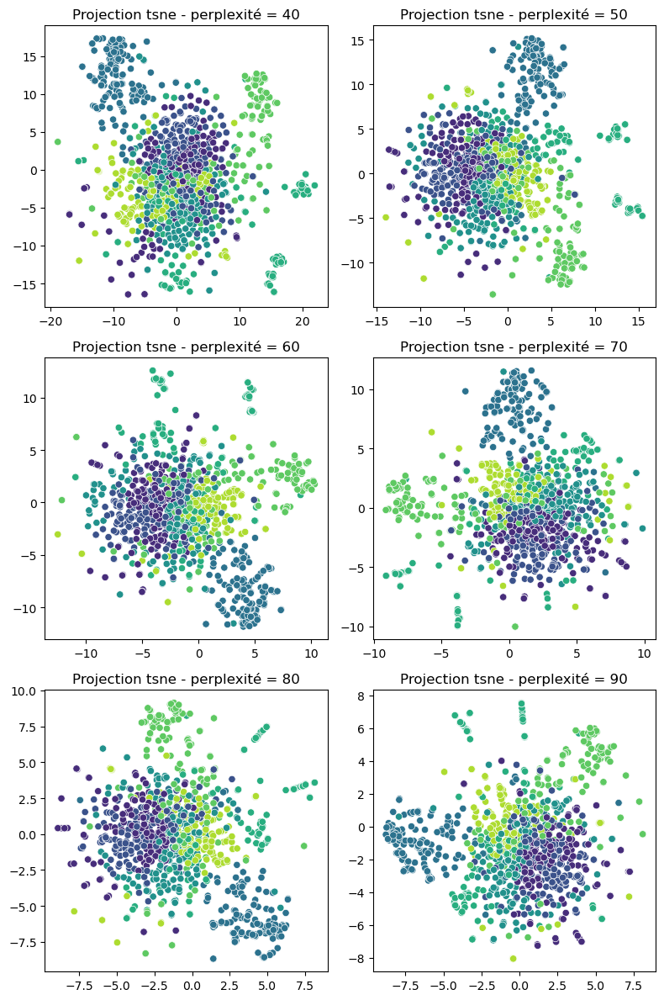

----------------------------------------------------------------------------------------------------
Meilleure perplexité de TSNE : 50
----------------------------------------------------------------------------------------------------
Meilleurs paramètres de KMeans : {'n_clusters': 7, 'random_state': 42, 'n_init': 10, 'max_iter': 100}


,coef_silh,dispersion,davies_bouldin
11,0.390404,12917.0625,0.81561


----------------------------------------------------------------------------------------------------
Score ARI du clustering : 0.3127
Homogénéité : 0.4190033873555978
Complétude : 0.437736482309171
V-measure : 0.4281651300491794
----------------------------------------------------------------------------------------------------
Comparaison des projections du clustering vs catégories réelles
->
VGG16_image_brut
----------------------------------------------------------------------------------------------------


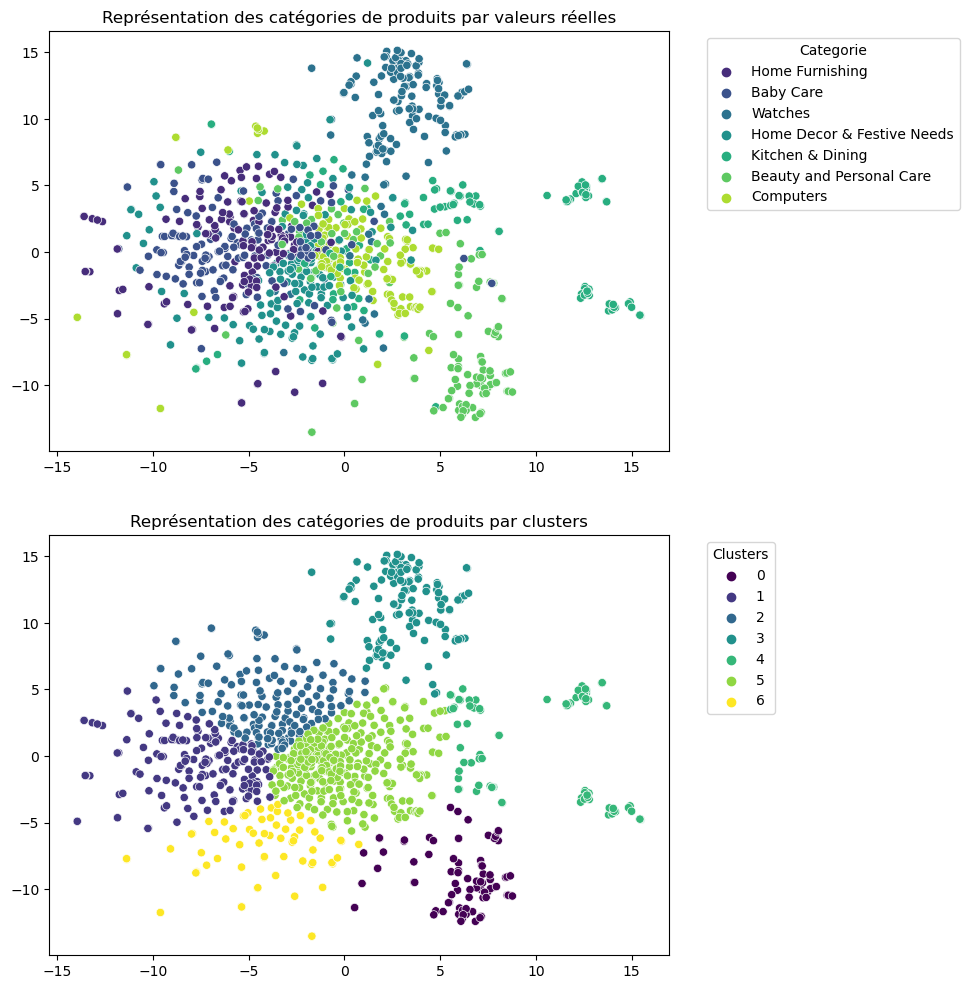

In [31]:
# Clustering 

kmeans_params, tsne_perplexity, labels, dict_result = \
    fct_clustering.best_clustering(
        features=X, 
        y_true=data['category_cleaned'],
        tsne_perplexity_range=[40, 50, 60, 70, 80, 90],
        kmeans_clusters=data['category_cleaned'].nunique(),
        ls_ninit=[10, 20, 30, 50, 70, 80, 100],
        ls_maxiter=[100, 200, 300, 400, 500],
        title='VGG16_image_brut', 
        )

In [32]:
# Enregistrement des résultats : 

# 1. Complétion de df : 
df['Category_true'] = data['category_cleaned']
df['Category_predict'] = labels

 # 2. Stockage des données : 
dict_img_class_non_supervisee['VGG16_image_brut'] = {
    'df_vectorisation': df,
    'kmeans_best_params': kmeans_params,
    'TSNE_perplexity' : tsne_perplexity,
    'clustering_result' : dict_result
}

# 3. Enregistrement du dictionnaire au format pickle : 
fct_data.enregistrement_pickle(
    name='dict_img_class_non_supervisee',
    chemin='2. Sauvegardes/2. IMAGE',
    fichier=dict_img_class_non_supervisee,
    )

del X, df, labels, kmeans_params, tsne_perplexity, dict_result

#### 6.2.2. <a id='toc6_2_2_'></a>[ResNet](#toc0_)


ResNet est composé de nombreuses couches de convolution empilées les unes sur les autres. Chaque couche est suivie d'une "connexion résiduelle" qui ajoute l'entrée de cette couche à la sortie, créant ainsi un "raccourci" pour les gradients. Cela permet au réseau d'apprendre des résidus (différences) entre les fonctions au lieu d'apprendre des fonctions complètes.

Il existe différents modèle distincts : 
- ResNet-18 
- ResNet-50
- ResNet-101
- ResNet-152

Le chiffre indiquant respectivement, le nmbre de couches de chaque modèle. Nous utiliserons ici le modèle le plus "complexe" (possèdant le plus grand nombre de couche) soit ResNet-152

|Modèle|Descirption|
|-|-|
|**ResNet-152v1**|Architecture de type "Residual Network" (ResNet) avec 152 couches. Utilisation de connexions résiduelles pour faciliter l'entraînement de réseaux profonds. Performance supérieure à VGG16 en général, grâce à sa profondeur.|
|**ResNet-152v2**|Version améliorée de ResNet-152v1 avec des ajustements pour une meilleure convergence et efficacité lors de l'entraînement. Conçu pour mieux résister au surapprentissage que ResNet-152v1.|

##### 6.2.2.1. <a id='toc6_2_2_1_'></a>[ResNet-152v1](#toc0_)

In [37]:
# Extraction de features : 

# Extraction des features: 
X = fct_image.extraction_features_resnet152(
    chemin_image=data['chemin_image'],
    version='v1',
)

# Création d'un DataFrame : 
df = pd.DataFrame(X, columns=[f"features_{i}" for i in range(X.shape[1])])


print('--'*50)
print('--'*50)

print(f"Dimension du DataFrame de vectorisation : {df.shape}")

print('--'*50)
print('--'*50)

Extraction des features:  64%|██████▍   | 677/1050 [00:09<00:05, 69.48it/s] /Users/maxime/anaconda3/envs/Projet6/lib/python3.11/site-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (93680328 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
Extraction des features: 100%|██████████| 1050/1050 [00:18<00:00, 58.13it/s]


33/33 [==============================] - 89s 3s/step
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
Dimension du DataFrame de vectorisation : (1050, 100352)
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------


----------------------------------------------------------------------------------------------------
Projections en 2D avec réduction TSNE en fonction de la perplexité


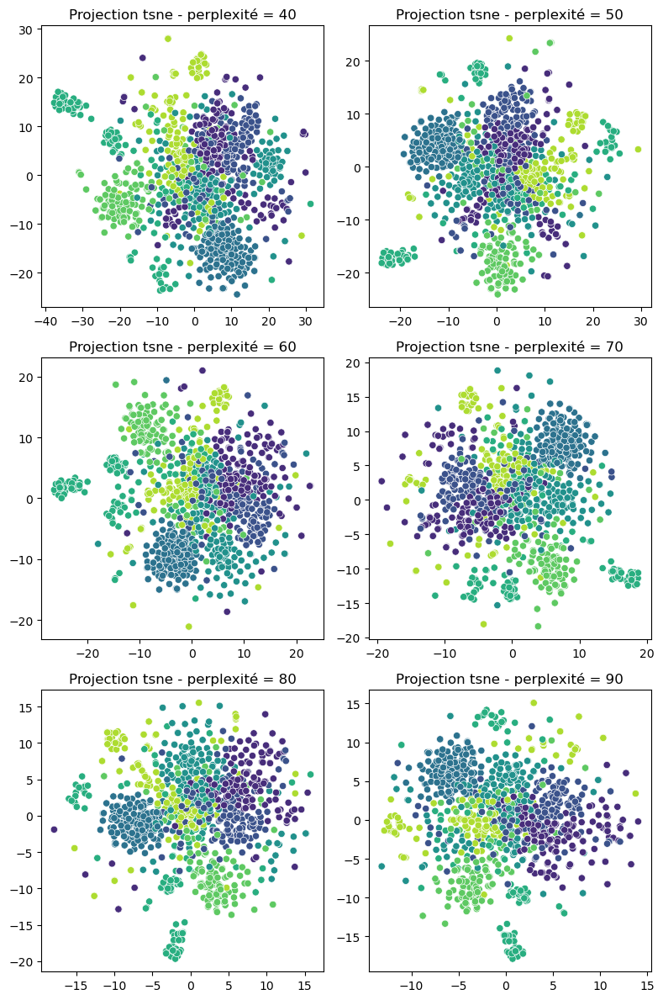

----------------------------------------------------------------------------------------------------
Meilleure perplexité de TSNE : 60
----------------------------------------------------------------------------------------------------
Meilleurs paramètres de KMeans : {'n_clusters': 7, 'random_state': 42, 'n_init': 10, 'max_iter': 100}


,coef_silh,dispersion,davies_bouldin
14,0.392962,28984.8125,0.782176


----------------------------------------------------------------------------------------------------
Score ARI du clustering : 0.4066
Homogénéité : 0.4760882364054797
Complétude : 0.4847066666562623
V-measure : 0.48035879742282417
----------------------------------------------------------------------------------------------------
Comparaison des projections du clustering vs catégories réelles
->
ResNet_152_v1_image_brut
----------------------------------------------------------------------------------------------------


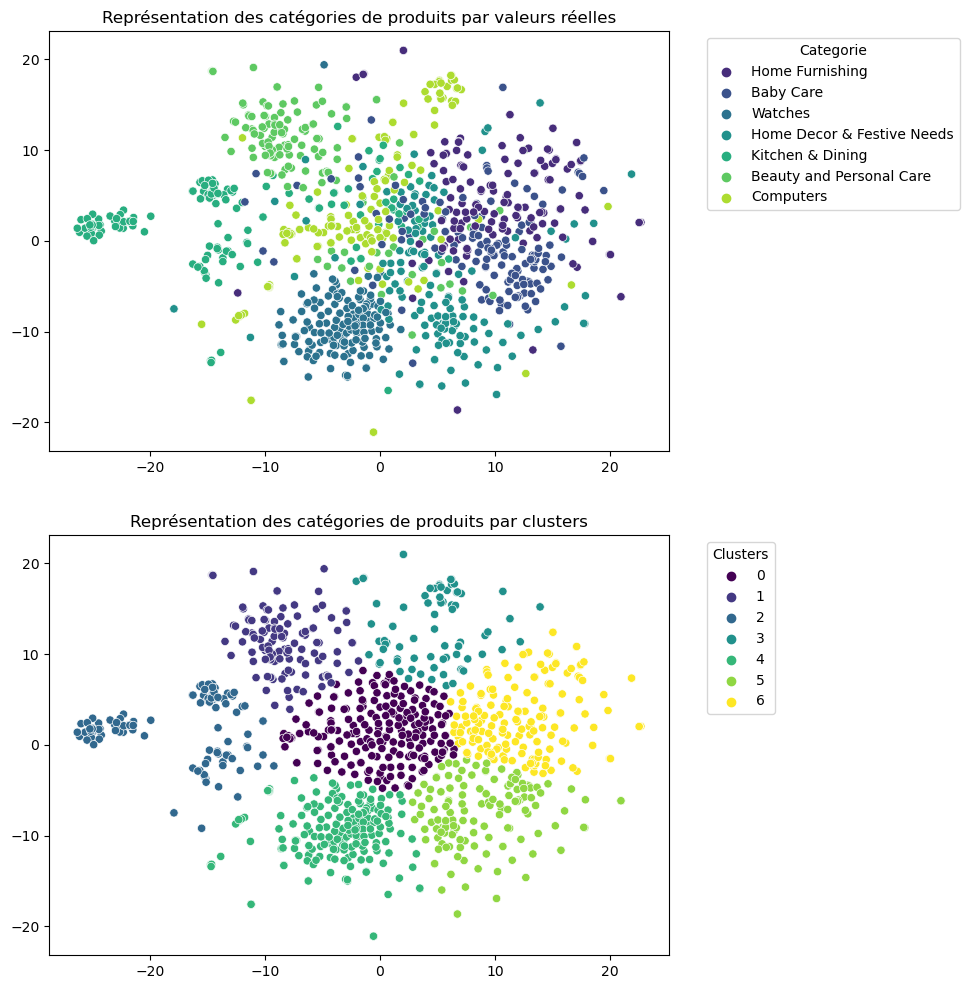

In [38]:
# Clustering 

kmeans_params, tsne_perplexity, labels, dict_result = \
    fct_clustering.best_clustering(
        features=X, 
        y_true=data['category_cleaned'],
        tsne_perplexity_range=[40, 50, 60, 70, 80, 90],
        kmeans_clusters=data['category_cleaned'].nunique(),
        ls_ninit=[10, 20, 30, 50, 70, 80, 100],
        ls_maxiter=[100, 200, 300, 400, 500],
        title='ResNet_152_v1_image_brut', 
        )

In [39]:
# Enregistrement des résultats : 

# 1. Complétion de df : 
df['Category_true'] = data['category_cleaned']
df['Category_predict'] = labels

 # 2. Stockage des données : 
dict_img_class_non_supervisee['ResNet_152_v1_image_brut'] = {
    'df_vectorisation': df,
    'kmeans_best_params': kmeans_params,
    'TSNE_perplexity' : tsne_perplexity,
    'clustering_result' : dict_result
}

# 3. Enregistrement du dictionnaire au format pickle : 
fct_data.enregistrement_pickle(
    name='dict_img_class_non_supervisee',
    chemin='2. Sauvegardes/2. IMAGE',
    fichier=dict_img_class_non_supervisee,
    )

del X, df, labels, kmeans_params, tsne_perplexity, dict_result

##### 6.2.2.2. <a id='toc6_2_2_2_'></a>[ResNet-152v2](#toc0_)

In [40]:
# Extraction de features : 

# Extraction des features: 
X = fct_image.extraction_features_resnet152(
    chemin_image=data['chemin_image'],
    version='v2',
)

# Création d'un DataFrame : 
df = pd.DataFrame(X, columns=[f"features_{i}" for i in range(X.shape[1])])


print('--'*50)
print('--'*50)

print(f"Dimension du DataFrame de vectorisation : {df.shape}")

print('--'*50)
print('--'*50)

Extraction des features:  64%|██████▍   | 670/1050 [00:09<00:05, 74.19it/s] /Users/maxime/anaconda3/envs/Projet6/lib/python3.11/site-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (93680328 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
Extraction des features: 100%|██████████| 1050/1050 [00:17<00:00, 59.40it/s]


33/33 [==============================] - 75s 2s/step
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
Dimension du DataFrame de vectorisation : (1050, 100352)
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------


----------------------------------------------------------------------------------------------------
Projections en 2D avec réduction TSNE en fonction de la perplexité


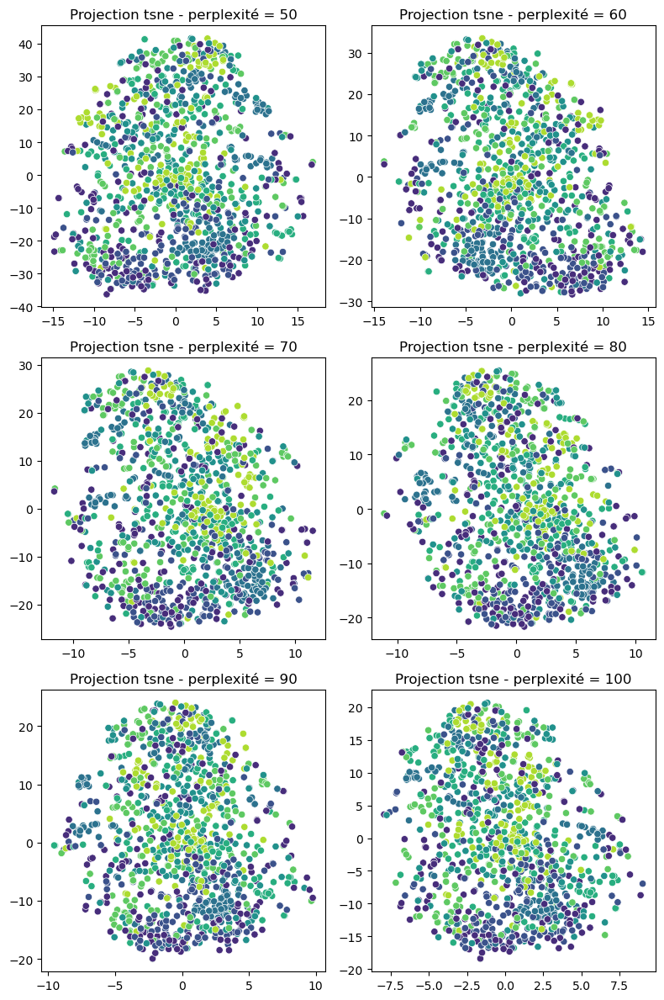

----------------------------------------------------------------------------------------------------
Meilleure perplexité de TSNE : 80
----------------------------------------------------------------------------------------------------
Meilleurs paramètres de KMeans : {'n_clusters': 7, 'random_state': 42, 'n_init': 10, 'max_iter': 100}


,coef_silh,dispersion,davies_bouldin
10,0.403105,16579.640625,0.854305


----------------------------------------------------------------------------------------------------
Score ARI du clustering : 0.0534
Homogénéité : 0.0890167451624261
Complétude : 0.08990133249190022
V-measure : 0.08945685208685795
----------------------------------------------------------------------------------------------------
Comparaison des projections du clustering vs catégories réelles
->
ResNet_152_v2_image_brut
----------------------------------------------------------------------------------------------------


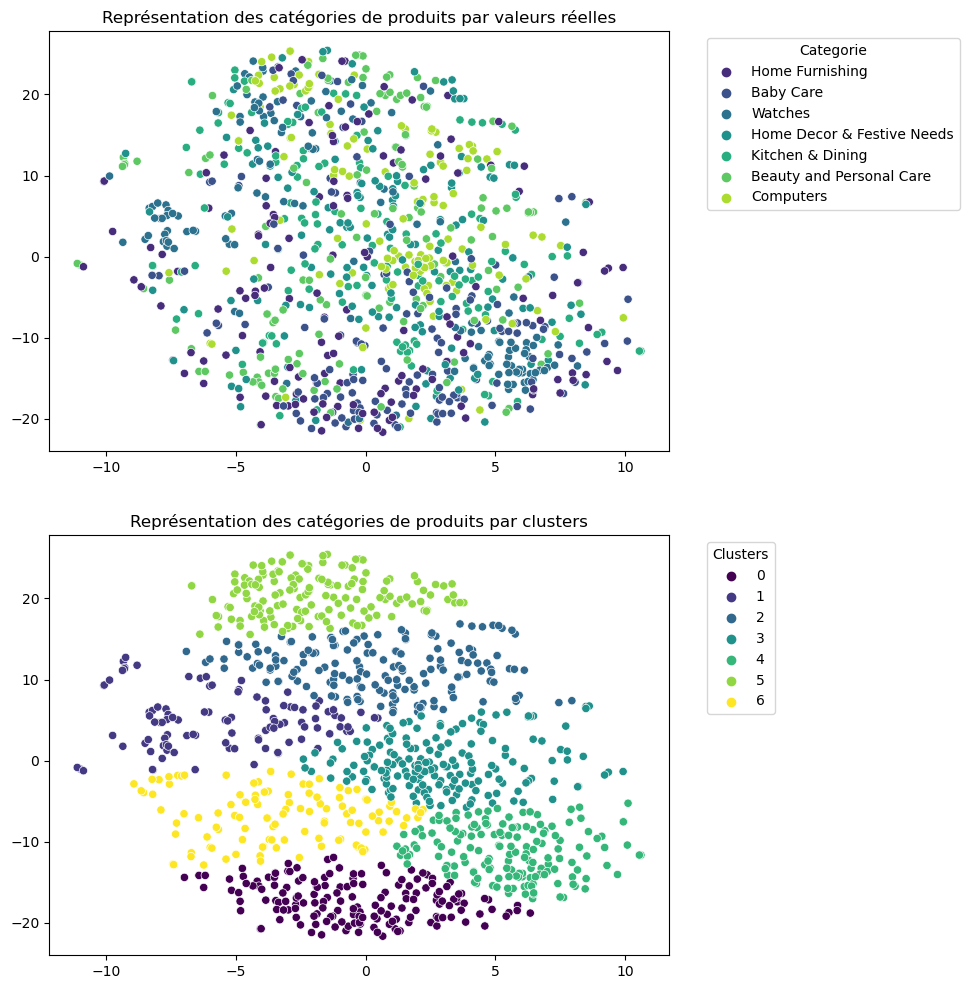

In [41]:
# Clustering 

kmeans_params, tsne_perplexity, labels, dict_result = \
    fct_clustering.best_clustering(
        features=X, 
        y_true=data['category_cleaned'],
        tsne_perplexity_range=[50, 60, 70, 80, 90, 100],
        kmeans_clusters=data['category_cleaned'].nunique(),
        ls_ninit=[10, 20, 30, 50, 70, 80, 100],
        ls_maxiter=[100, 200, 300, 400, 500],
        title='ResNet_152_v2_image_brut', 
        )

In [42]:
# Enregistrement des résultats : 

# 1. Complétion de df : 
df['Category_true'] = data['category_cleaned']
df['Category_predict'] = labels

 # 2. Stockage des données : 
dict_img_class_non_supervisee['ResNet_152_v2_image_brut'] = {
    'df_vectorisation': df,
    'kmeans_best_params': kmeans_params,
    'TSNE_perplexity' : tsne_perplexity,
    'clustering_result' : dict_result
}

# 3. Enregistrement du dictionnaire au format pickle : 
fct_data.enregistrement_pickle(
    name='dict_img_class_non_supervisee',
    chemin='2. Sauvegardes/2. IMAGE',
    fichier=dict_img_class_non_supervisee,
    )

del X, df, labels, kmeans_params, tsne_perplexity, dict_result

#### 6.2.3. <a id='toc6_2_3_'></a>[ IncetpionNet](#toc0_)
Architecture développée par Google, utilisant des modules Inception avec des filtres de convolution parallèles de différentes tailles.  
Le but étant de capturer des informations à différentes échelles spatiales en utilisant divers filtres.

|Modèle|Dexcription|
|-|-|
|**Inception_v3**|Amélioration de l'architecture, avec une attention particulière à la réduction du surapprentissage|
|**Inception_ResNet**|Combinaison des concepts des architectures Inception et ResNet pour créer un modèle qui combine les avantages des deux approches. Intègration des connexions résiduelles dans les modules Inception pour une meilleure stabilité de l'entraînement|

##### 6.2.3.1. <a id='toc6_2_3_1_'></a>[InceptionNet_V3](#toc0_)

In [43]:
# Extraction de features : 

# Extraction des features: 
X = fct_image.extraction_features_inceptionnet(
    chemin_image=data['chemin_image'],
    version='inceptionv3',
)

# Création d'un DataFrame : 
df = pd.DataFrame(X, columns=[f"features_{i}" for i in range(X.shape[1])])


print('--'*50)
print('--'*50)

print(f"Dimension du DataFrame de vectorisation : {df.shape}")

print('--'*50)
print('--'*50)

Extraction des features:  64%|██████▍   | 670/1050 [00:09<00:05, 73.27it/s] /Users/maxime/anaconda3/envs/Projet6/lib/python3.11/site-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (93680328 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
Extraction des features: 100%|██████████| 1050/1050 [00:17<00:00, 59.10it/s]


33/33 [==============================] - 41s 1s/step
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
Dimension du DataFrame de vectorisation : (1050, 131072)
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------


----------------------------------------------------------------------------------------------------
Projections en 2D avec réduction TSNE en fonction de la perplexité


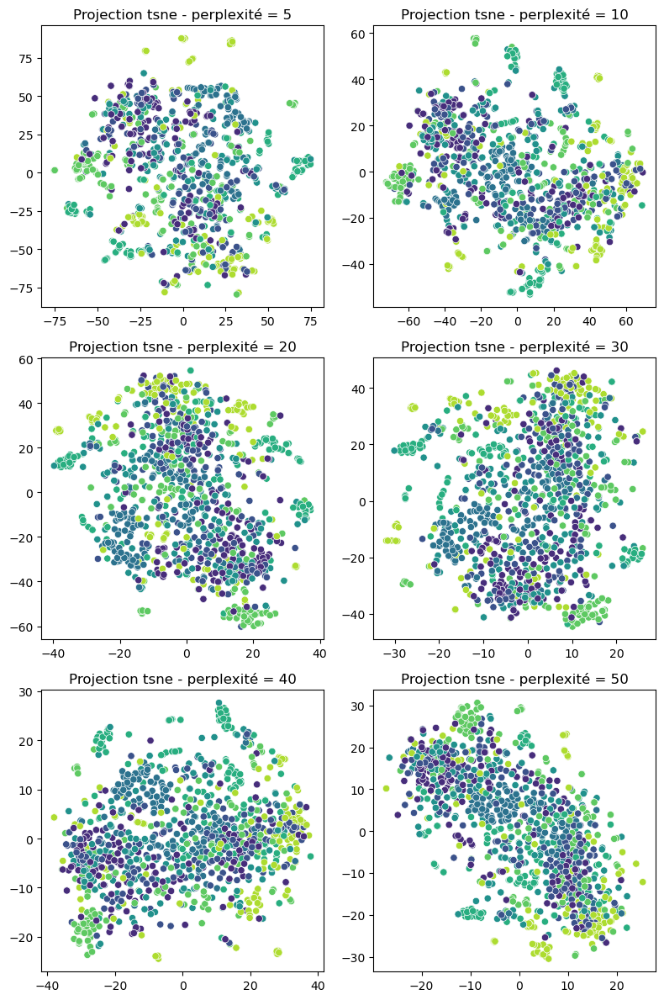

----------------------------------------------------------------------------------------------------
Meilleure perplexité de TSNE : 5
----------------------------------------------------------------------------------------------------
Meilleurs paramètres de KMeans : {'n_clusters': 7, 'random_state': 42, 'n_init': 10, 'max_iter': 100}


,coef_silh,dispersion,davies_bouldin
33,0.384821,388880.125,0.80865


----------------------------------------------------------------------------------------------------
Score ARI du clustering : 0.101
Homogénéité : 0.15925766380394576
Complétude : 0.161816507518949
V-measure : 0.16052688913718194
----------------------------------------------------------------------------------------------------
Comparaison des projections du clustering vs catégories réelles
->
InceptionNet_v3_image_brut
----------------------------------------------------------------------------------------------------


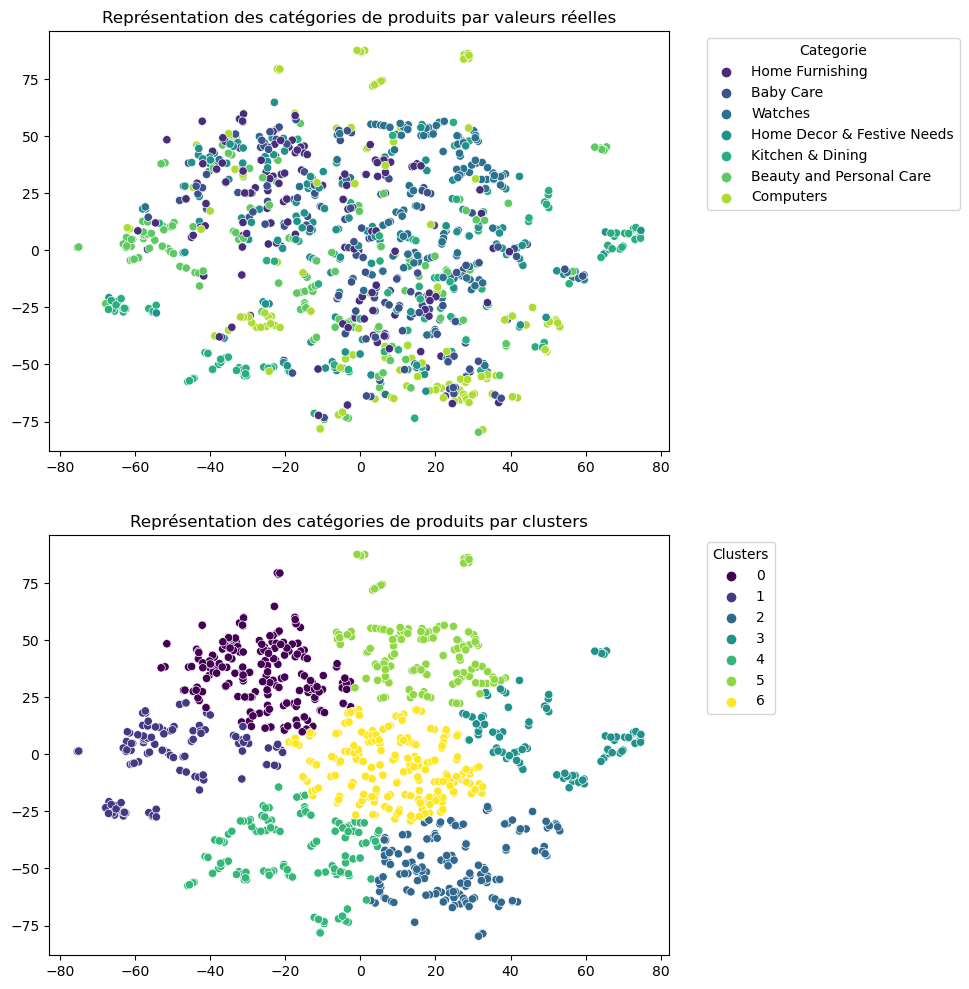

In [44]:
# Clustering 

kmeans_params, tsne_perplexity, labels, dict_result = \
    fct_clustering.best_clustering(
        features=X, 
        y_true=data['category_cleaned'],
        tsne_perplexity_range=[5, 10, 20, 30, 40, 50],
        kmeans_clusters=data['category_cleaned'].nunique(),
        ls_ninit=[10, 20, 30, 50, 70, 80, 100],
        ls_maxiter=[100, 200, 300, 400, 500],
        title='InceptionNet_v3_image_brut', 
        )

In [45]:
# Enregistrement des résultats : 

# 1. Complétion de df : 
df['Category_true'] = data['category_cleaned']
df['Category_predict'] = labels

 # 2. Stockage des données : 
dict_img_class_non_supervisee['InceptionNet_v3_image_brut'] = {
    'df_vectorisation': df,
    'kmeans_best_params': kmeans_params,
    'TSNE_perplexity' : tsne_perplexity,
    'clustering_result' : dict_result
}

# 3. Enregistrement du dictionnaire au format pickle : 
fct_data.enregistrement_pickle(
    name='dict_img_class_non_supervisee',
    chemin='2. Sauvegardes',
    fichier=dict_img_class_non_supervisee,
    )

del X, df, labels, kmeans_params, tsne_perplexity, dict_result

##### 6.2.3.2. <a id='toc6_2_3_2_'></a>[InceptionNet_ResNet](#toc0_)

In [46]:
# Extraction de features : 

# Extraction des features: 
X = fct_image.extraction_features_inceptionnet(
    chemin_image=data['chemin_image'],
    version='inceptionresnet',
)

# Création d'un DataFrame : 
df = pd.DataFrame(X, columns=[f"features_{i}" for i in range(X.shape[1])])


print('--'*50)
print('--'*50)

print(f"Dimension du DataFrame de vectorisation : {df.shape}")

print('--'*50)
print('--'*50)

Extraction des features:  64%|██████▍   | 670/1050 [00:09<00:05, 72.00it/s] /Users/maxime/anaconda3/envs/Projet6/lib/python3.11/site-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (93680328 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
Extraction des features: 100%|██████████| 1050/1050 [00:17<00:00, 58.96it/s]


33/33 [==============================] - 88s 3s/step
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
Dimension du DataFrame de vectorisation : (1050, 98304)
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------


----------------------------------------------------------------------------------------------------
Projections en 2D avec réduction TSNE en fonction de la perplexité


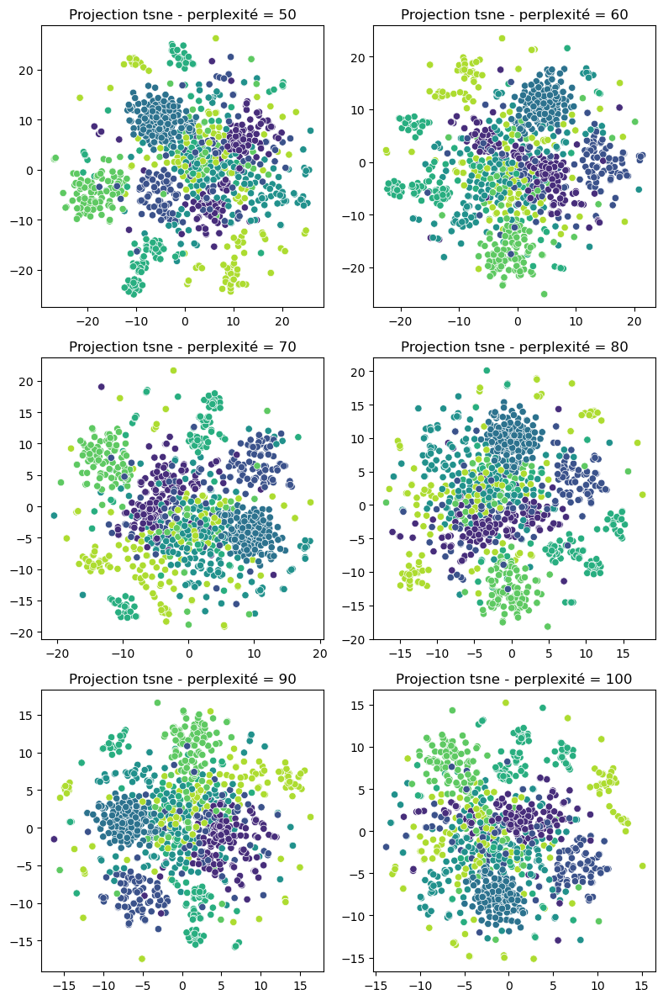

----------------------------------------------------------------------------------------------------
Meilleure perplexité de TSNE : 80
----------------------------------------------------------------------------------------------------
Meilleurs paramètres de KMeans : {'n_clusters': 7, 'random_state': 42, 'n_init': 10, 'max_iter': 100}


,coef_silh,dispersion,davies_bouldin
0,0.402469,20864.953125,0.753307


----------------------------------------------------------------------------------------------------
Score ARI du clustering : 0.3682
Homogénéité : 0.430013608808307
Complétude : 0.43847924577046726
V-measure : 0.4342051678772934
----------------------------------------------------------------------------------------------------
Comparaison des projections du clustering vs catégories réelles
->
InceptionNet_ResNet_image_brut
----------------------------------------------------------------------------------------------------


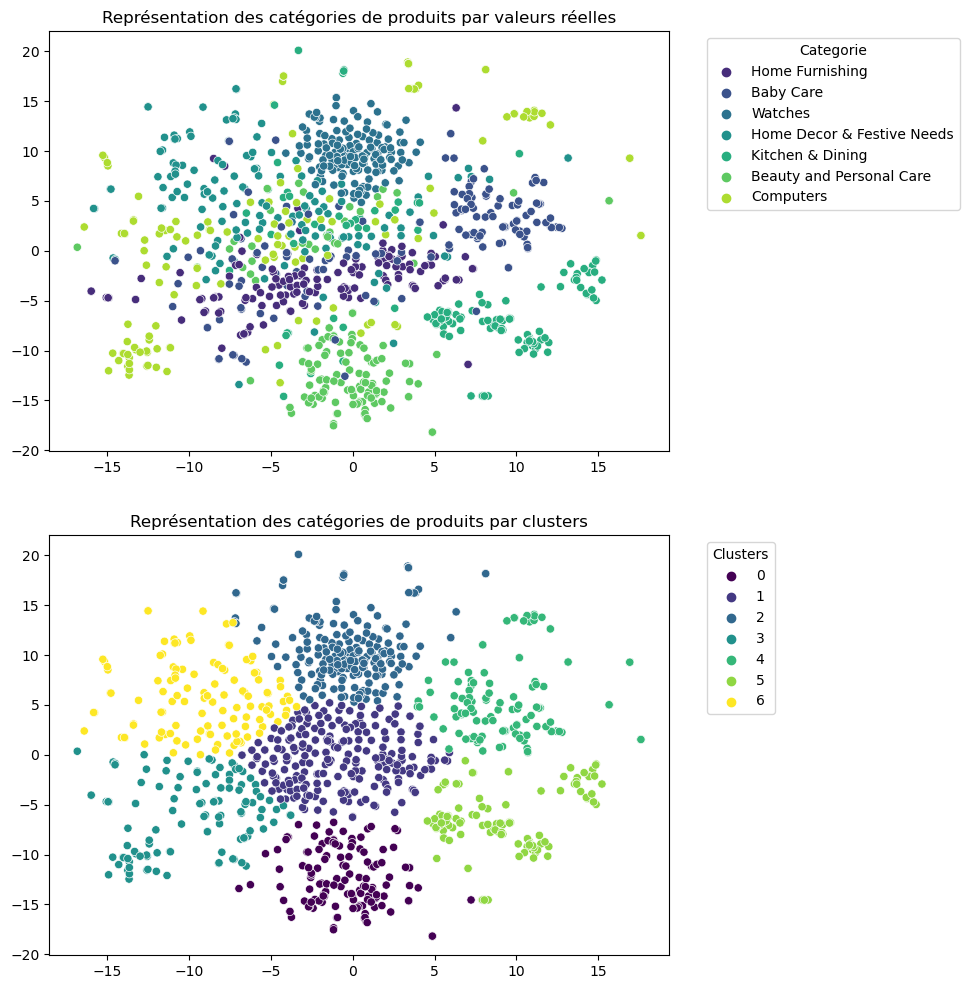

In [47]:
# Clustering 

kmeans_params, tsne_perplexity, labels, dict_result = \
    fct_clustering.best_clustering(
        features=X, 
        y_true=data['category_cleaned'],
        tsne_perplexity_range=[50, 60, 70, 80, 90, 100],
        kmeans_clusters=data['category_cleaned'].nunique(),
        ls_ninit=[10, 20, 30, 50, 70, 80, 100],
        ls_maxiter=[100, 200, 300, 400, 500],
        title='InceptionNet_ResNet_image_brut', 
        )

In [48]:
# Enregistrement des résultats : 

# 1. Complétion de df : 
df['Category_true'] = data['category_cleaned']
df['Category_predict'] = labels

 # 2. Stockage des données : 
dict_img_class_non_supervisee['InceptionNet_ResNet_image_brut'] = {
    'df_vectorisation': df,
    'kmeans_best_params': kmeans_params,
    'TSNE_perplexity' : tsne_perplexity,
    'clustering_result' : dict_result
}

# 3. Enregistrement du dictionnaire au format pickle : 
fct_data.enregistrement_pickle(
    name='dict_img_class_non_supervisee',
    chemin='2. Sauvegardes/2. IMAGE',
    fichier=dict_img_class_non_supervisee,
    )

del X, df, labels, kmeans_params, tsne_perplexity, dict_result

## 7. <a id='toc7_'></a>[Résultats](#toc0_)

In [27]:
# Chargement des données : 

dict_img_class_non_supervisee = \
    fct_data.chargement_pickle(
        name='dict_img_class_non_supervisee',
        chemin='2. Sauvegardes/2. IMAGE',
        )
        
data = \
    fct_data.chargement_pickle(
        name='data_pretraite_image',
        chemin='2. Sauvegardes/2. IMAGE',
    )

,ARI,Homogénéité,Complétude,V-measure
Modèle,,,,
ResNet_152_v1_image_brut,0.4066,0.476088,0.484707,0.480359
InceptionNet_ResNet_image_brut,0.3682,0.430014,0.438479,0.434205
VGG16_image_brut,0.3127,0.419003,0.437736,0.428165
InceptionNet_v3_image_brut,0.1010,0.159258,0.161817,0.160527
SIFT_image_pretraitee,0.0555,0.091374,0.092619,0.091992
ResNet_152_v2_image_brut,0.0534,0.089017,0.089901,0.089457


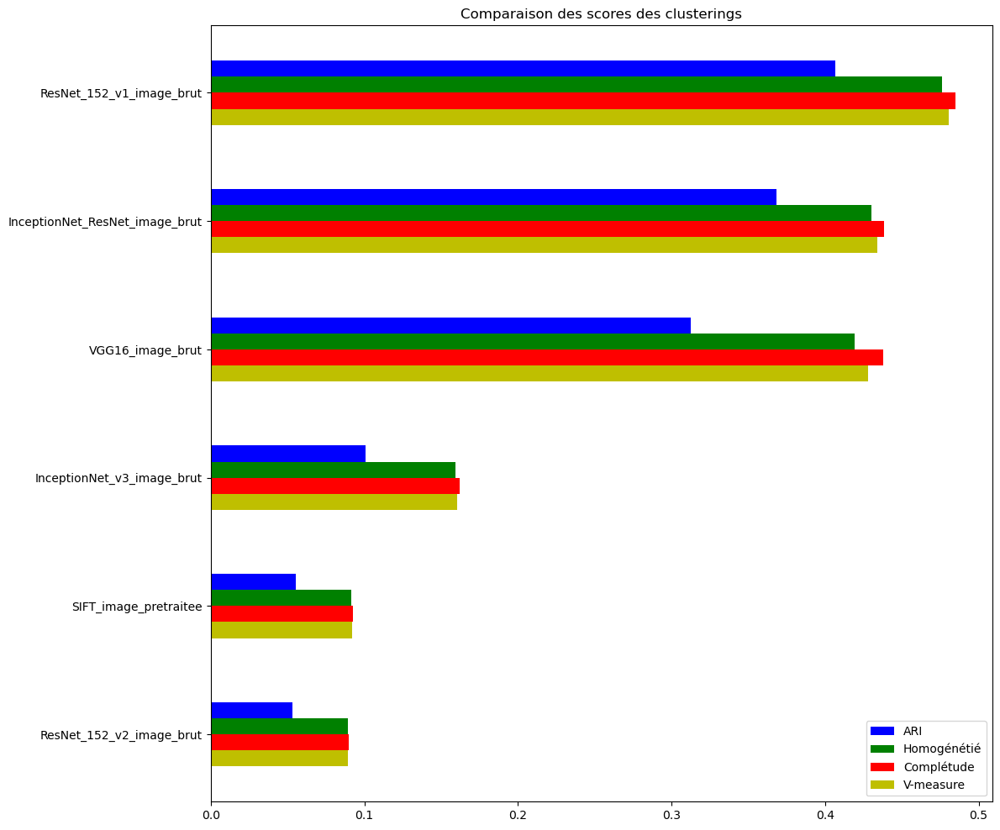

In [28]:
# Visualisation des métriques des clusterings : 
fct_clustering.classement_resultats(dict_img_class_non_supervisee)

Le modèle d'extraction de features ResNet_152_v1 est celui donnant les meilleures performances de clustering.

,Cluster,Nombre,%
0,0,205,19.523810
4,1,135,12.857143
5,2,113,10.761905
6,3,90,8.571429
1,4,192,18.285714
3,5,141,13.428571
2,6,174,16.571429


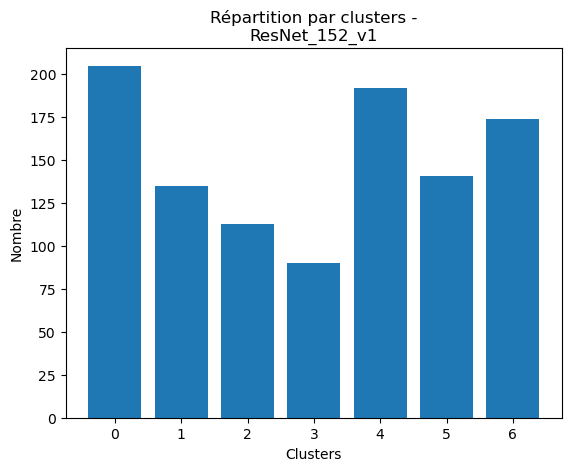

In [29]:
# Caractérisation du clustring pour ResNet_152_v1 : 
df_ResNet_152_v1 = dict_img_class_non_supervisee['ResNet_152_v1_image_brut']['df_vectorisation'].copy()

fct_clustering.generate_cluster_dataframe(
    col_label=df_ResNet_152_v1['Category_predict'],
    title='ResNet_152_v1',
    )

In [30]:
# Visualisation des catégories par clusters : 
print('\t----->ResNet_152_v1')
df_ResNet_152_v1.groupby('Category_predict')['Category_true'].value_counts().to_frame()

	----->ResNet_152_v1


count
Category_predict Category_true                    
0                Computers                      76
                 Home Decor & Festive Needs     48
                 Kitchen & Dining               28
                 Baby Care                      24
                 Beauty and Personal Care       16
                 Home Furnishing                10
                 Watches                         3
1                Beauty and Personal Care      119
                 Computers                       5
                 Kitchen & Dining                4
                 Baby Care                       4
                 Home Decor & Festive Needs      2
                 Watches                         1
2                Kitchen & Dining              104
                 Baby Care                       3
                 Home Furnishing                 2
                 Home Decor & Festive Needs      2
                 Computers                       2
3                Computers                      40
                 Home Furnishing                29
                 Home Decor & Festive Needs      8
                 Kitchen & Dining                6
                 Beauty and Personal Care        4
                 Baby Care                       3
4                Watches                       146
                 Computers                      21
                 Home Decor & Festive Needs     12
                 Kitchen & Dining                7
                 Beauty and Personal Care        3
                 Baby Care                       3
5                Home Decor & Festive Needs     71
                 Baby Care                      50
                 Home Furnishing                10
                 Beauty and Personal Care        5
                 Computers                       4
                 Kitchen & Dining                1
6                Home Furnishing                99
                 Baby Care                      63
                 Home Decor & Festive Needs      7
                 Beauty and Personal Care        3
                 Computers                       2

In [31]:
# Récupération du dictionnaire de correspondance 
dico_categ = fct_clustering.find_best_cluster_mapping(
    true_categories=df_ResNet_152_v1['Category_true'],
    cluster_labels=df_ResNet_152_v1['Category_predict'],
)

Meilleure accuracy : 0.5885714285714285
Dictionnaire de traduction :


{0: 'Computers',
 1: 'Beauty and Personal Care',
 2: 'Kitchen & Dining',
 3: 'Baby Care',
 4: 'Watches',
 5: 'Home Decor & Festive Needs',
 6: 'Home Furnishing'}

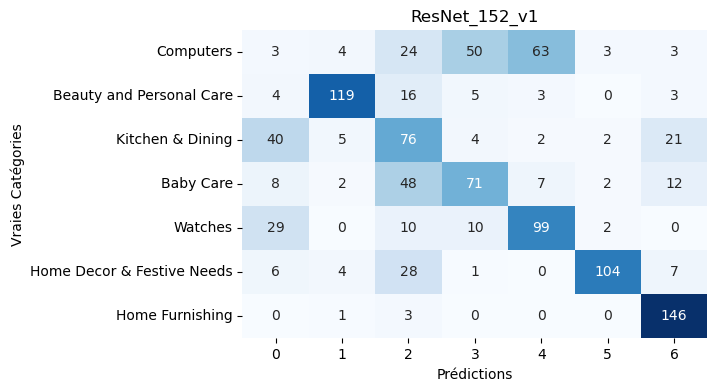

                            precision    recall  f1-score   support

                 Baby Care       0.03      0.02      0.03       150
  Beauty and Personal Care       0.88      0.79      0.84       150
                 Computers       0.37      0.51      0.43       150
Home Decor & Festive Needs       0.50      0.47      0.49       150
           Home Furnishing       0.57      0.66      0.61       150
          Kitchen & Dining       0.92      0.69      0.79       150
                   Watches       0.76      0.97      0.85       150

                  accuracy                           0.59      1050
                 macro avg       0.58      0.59      0.58      1050
              weighted avg       0.58      0.59      0.58      1050



In [32]:
# Métriques sur la qualité de la catégorisation : 

fct_clustering.qualite_categorisation(
    df=df_ResNet_152_v1,
    dico_trad=dico_categ,
    title='ResNet_152_v1',
    )

Bilan pour du clustering avec ResNet_152_v1 sur les images :  
- ARI = 0.4066
- Précision : 59 % 

En se basant uniquement sur la catégorisation par les images, nous avons ici une précision de 59 %.  
Certaines catégories posant de réels problèmes tel que Baby Care (f1_score de 3%)

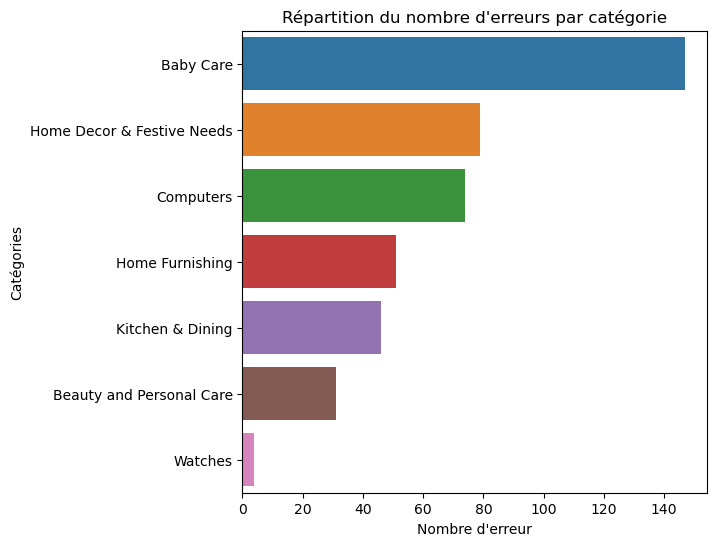

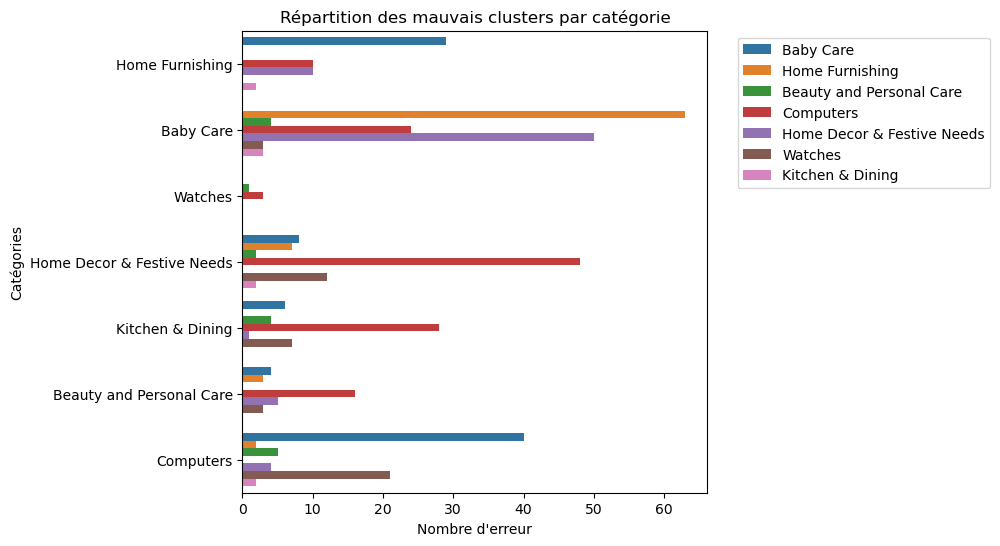

Les plus grosses erreurs sont dues au clusturing de Computers


In [33]:
# Visualisation de la répartition des erreurs par catégories :  
fct_clustering.repartition_erreurs(
    df=df_ResNet_152_v1,
    dico_trad=dico_categ,
)

Bilan :

La catégorisation avec les images uniquement possède une moins bonne précision qu'avec les descriptions des produits : 
    
    -> 59% pour les images contre 75% pour les descriptions. 

,product_name,description,image,category_true,category_predict
0,The Intellect Bazaar Plain King Blanket Grey,Buy The Intellect Bazaar Plain King Blanket Gr...,bba68d75eff1b7b5eef7f6c1c68f2227.jpg,Home Furnishing,Baby Care
1,NKP Cotton Hand Towel,"NKP Cotton Hand Towel (Hand Towel, White)\r\n ...",e1e2883b6845cb214ec8d365cd496008.jpg,Home Furnishing,Computers
2,HomeeHub Polyester Multicolor Self Design Eyel...,Buy HomeeHub Polyester Multicolor Self Design ...,43f4a023dd92830ab5b26886c496f23e.jpg,Home Furnishing,Baby Care
3,Fs Mini Klub Baby Boy's Woven Casual Shirt,Key Features of Fs Mini Klub Baby Boy's Woven ...,480d24adbc304a52a4e01e45bf8bbccc.jpg,Baby Care,Home Decor & Festive Needs
4,"Offspring Embroidered, Solid Single Wrapper Wh...","Offspring Embroidered, Solid Single Wrapper Wh...",093bcad64d11c0aed903a8dd787ef069.jpg,Baby Care,Home Furnishing
5,Wallmantra Medium Vinyl Sticker Sticker,Buy Wallmantra Medium Vinyl Sticker Sticker fo...,c3edc504d1b4f0ba6224fa53a43a7ad6.jpg,Baby Care,Watches
6,Calibro SW-125 Analog-Digital Watch - For Men...,Calibro SW-125 Analog-Digital Watch - For Men...,920154acbe49d3202ed7d2ed2df1ea13.jpg,Watches,Beauty and Personal Care
7,Adino ADF04 Analog Watch - For Girls,Specifications of Adino ADF04 Analog Watch - ...,553aa0252537751d153e7c50029f0242.jpg,Watches,Computers
8,"Titan 1639SL03 Analog Watch - For Boys, Men","Titan 1639SL03 Analog Watch - For Boys, Men -...",189fa66a5fa6f08d2802a62ecf0be298.jpg,Watches,Computers
9,TRUE Bong,Buy TRUE Bong for Rs.549 online. TRUE Bong at ...,17611e6e94d73ef376834e5c6ee03dde.jpg,Home Decor & Festive Needs,Computers


----------------------------------------------------------------------------------------------------
Produit 0 :
Nom du produit : The Intellect Bazaar Plain King Blanket Grey
Catégorie réelle : Home Furnishing
Catégorie prédite : Baby Care


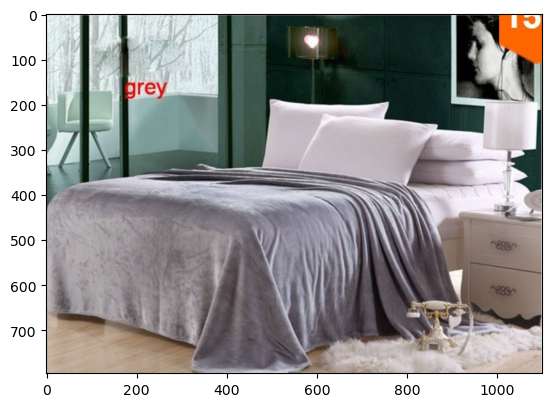

----------------------------------------------------------------------------------------------------
Produit 1 :
Nom du produit : NKP Cotton Hand Towel
Catégorie réelle : Home Furnishing
Catégorie prédite : Computers


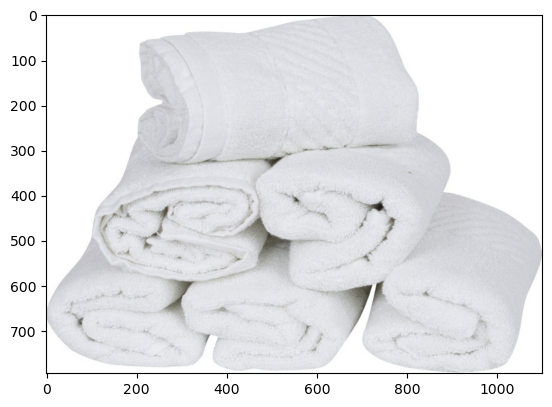

----------------------------------------------------------------------------------------------------
Produit 2 :
Nom du produit : HomeeHub Polyester Multicolor Self Design Eyelet Window Curtain
Catégorie réelle : Home Furnishing
Catégorie prédite : Baby Care


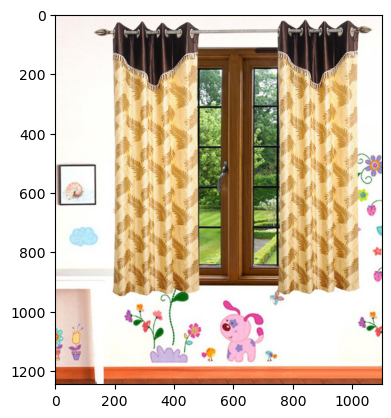

----------------------------------------------------------------------------------------------------
Produit 3 :
Nom du produit : Fs Mini Klub Baby Boy's Woven Casual Shirt
Catégorie réelle : Baby Care
Catégorie prédite : Home Decor & Festive Needs


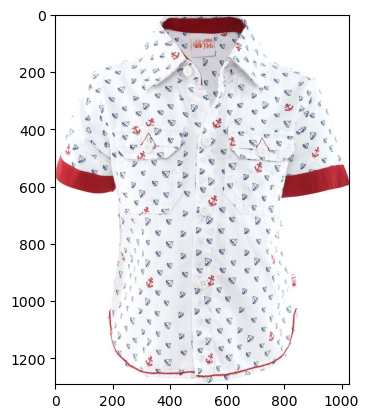

----------------------------------------------------------------------------------------------------
Produit 4 :
Nom du produit : Offspring Embroidered, Solid Single Wrapper White, Pink
Catégorie réelle : Baby Care
Catégorie prédite : Home Furnishing


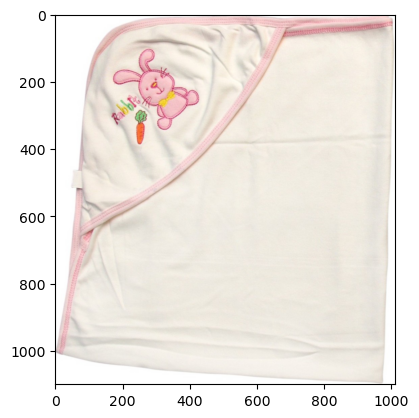

----------------------------------------------------------------------------------------------------
Produit 5 :
Nom du produit : Wallmantra Medium Vinyl Sticker Sticker
Catégorie réelle : Baby Care
Catégorie prédite : Watches


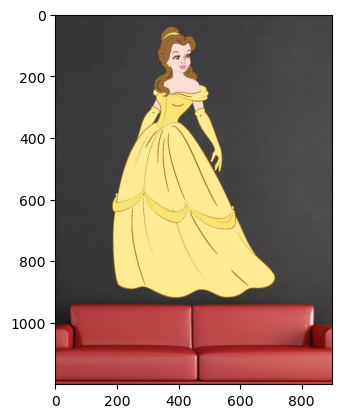

----------------------------------------------------------------------------------------------------
Produit 6 :
Nom du produit : Calibro SW-125 Analog-Digital Watch  - For Men, Boys
Catégorie réelle : Watches
Catégorie prédite : Beauty and Personal Care


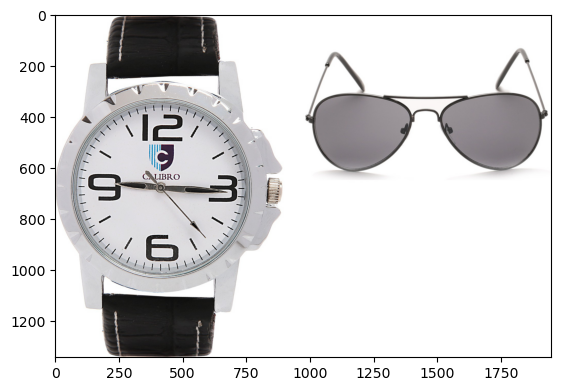

----------------------------------------------------------------------------------------------------
Produit 7 :
Nom du produit : Adino ADF04 Analog Watch  - For Girls
Catégorie réelle : Watches
Catégorie prédite : Computers


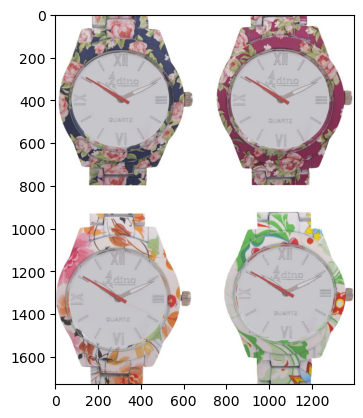

----------------------------------------------------------------------------------------------------
Produit 8 :
Nom du produit : Titan 1639SL03 Analog Watch  - For Boys, Men
Catégorie réelle : Watches
Catégorie prédite : Computers


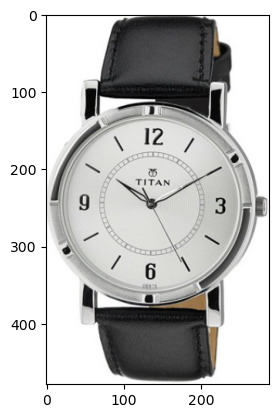

----------------------------------------------------------------------------------------------------
Produit 9 :
Nom du produit : TRUE Bong
Catégorie réelle : Home Decor & Festive Needs
Catégorie prédite : Computers


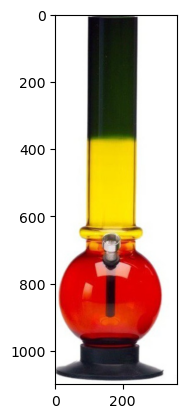

----------------------------------------------------------------------------------------------------
Produit 10 :
Nom du produit : Shoppingtara Paper Mache 3 Piece Elephant Home Decor Gift Showpiece  -  4 cm
Catégorie réelle : Home Decor & Festive Needs
Catégorie prédite : Baby Care


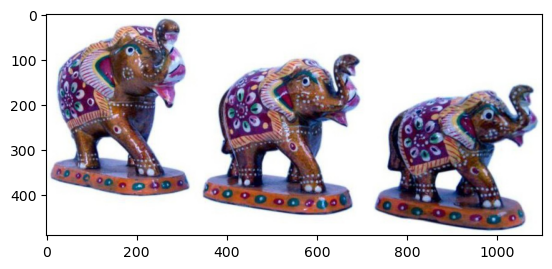

----------------------------------------------------------------------------------------------------
Produit 11 :
Nom du produit : Tiedribbons We Love Mom With Green Background Tile Showpiece  -  28 cm
Catégorie réelle : Home Decor & Festive Needs
Catégorie prédite : Kitchen & Dining


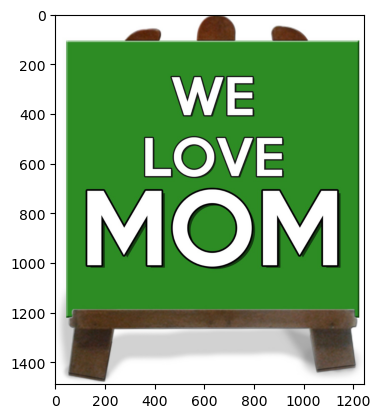

----------------------------------------------------------------------------------------------------
Produit 12 :
Nom du produit : JayEnterprise Plastic Hand Juicer
Catégorie réelle : Kitchen & Dining
Catégorie prédite : Computers


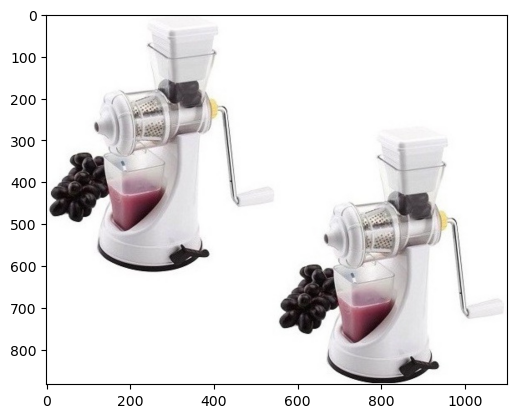

----------------------------------------------------------------------------------------------------
Produit 13 :
Nom du produit : Ocean CPGW087
Catégorie réelle : Kitchen & Dining
Catégorie prédite : Computers


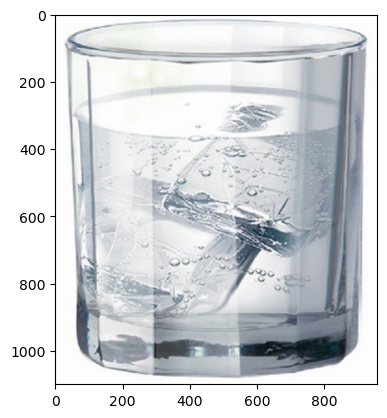

----------------------------------------------------------------------------------------------------
Produit 14 :
Nom du produit : Ornate 7 W LED Bulb
Catégorie réelle : Kitchen & Dining
Catégorie prédite : Computers


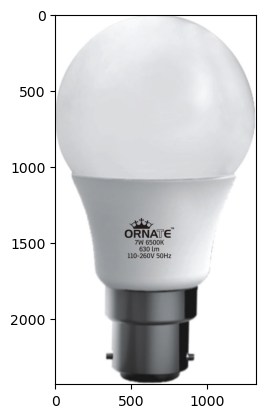

----------------------------------------------------------------------------------------------------
Produit 15 :
Nom du produit : Garnier Nutrisse Haircolor Hair Color
Catégorie réelle : Beauty and Personal Care
Catégorie prédite : Computers


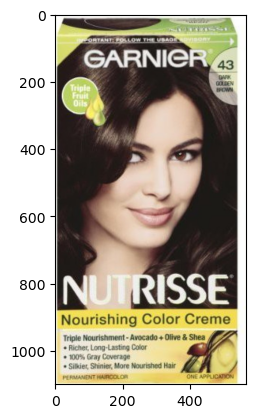

----------------------------------------------------------------------------------------------------
Produit 16 :
Nom du produit : Sarah Stylish Hair Claw
Catégorie réelle : Beauty and Personal Care
Catégorie prédite : Home Decor & Festive Needs


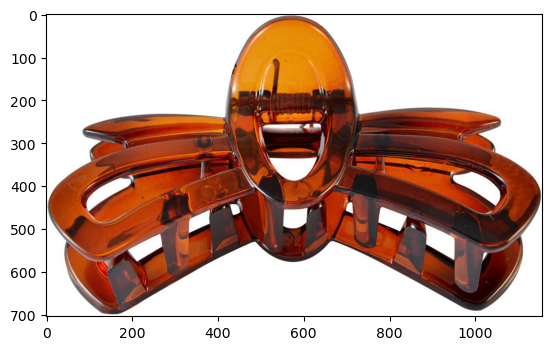

----------------------------------------------------------------------------------------------------
Produit 17 :
Nom du produit : Borse N16 Make Up And Jewellery Vanity Case
Catégorie réelle : Beauty and Personal Care
Catégorie prédite : Computers


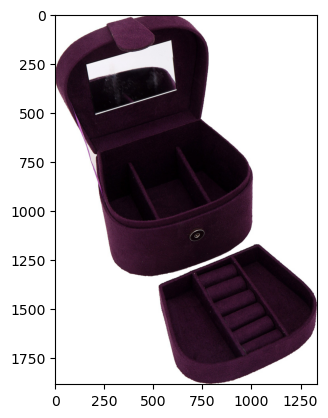

----------------------------------------------------------------------------------------------------
Produit 18 :
Nom du produit : Zingalalaa LP-50 50 lm LED Corded Portable Projector
Catégorie réelle : Computers
Catégorie prédite : Home Furnishing


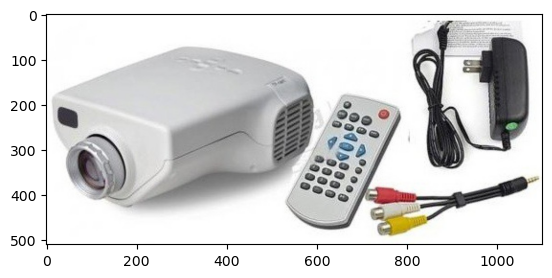

----------------------------------------------------------------------------------------------------
Produit 19 :
Nom du produit : JRB 1042 Smallest Mobile Powered By OTG Enabled Android Smart Phone Portable 1042 USB Fan
Catégorie réelle : Computers
Catégorie prédite : Baby Care


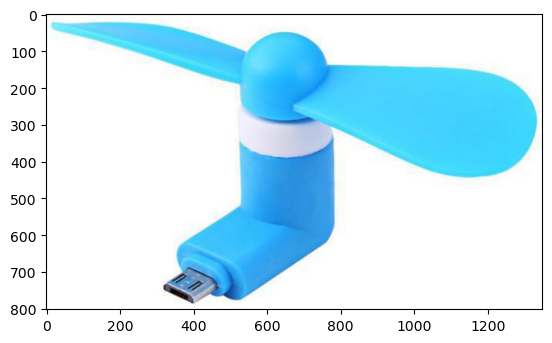

----------------------------------------------------------------------------------------------------
Produit 20 :
Nom du produit : PRINT SHAPES Graphic Dancer Laptop Skin with Mouse pad Combo Set
Catégorie réelle : Computers
Catégorie prédite : Watches


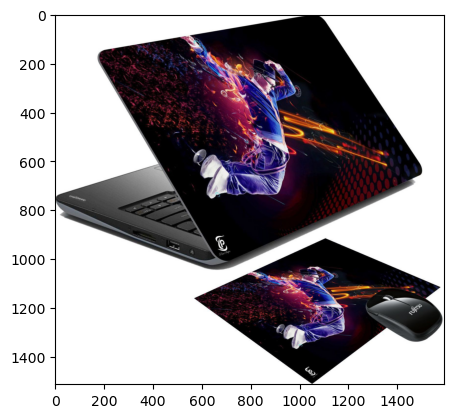

In [34]:
# Visualisation des descriptions de 3 produits par catégories avec une mauvaise classification : 
fct_clustering.dataframe_comp_result(
    df_init=data,
    df_categ=df_ResNet_152_v1,
    dico_trad=dico_categ,
    chemin='1. Données/Images',
    type='image'
)